<a href="https://colab.research.google.com/github/agustinsantos/CorrelatedQPQ/blob/main/Testing_QPQ_Copulas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [31]:
from scipy import stats
from scipy.stats import norm
from scipy.stats import pearsonr, spearmanr

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [32]:
from statsmodels.distributions.copula.api import (CopulaDistribution, GumbelCopula, IndependenceCopula, ClaytonCopula, FrankCopula, GaussianCopula, ArchimedeanCopula, StudentTCopula)
from statsmodels.distributions.empirical_distribution import ECDF, monotone_fn_inverter
default_rng = np.random.default_rng()

In [33]:
!pip install pycop --quiet
from pycop import simulation
from pycop import utils

In [34]:
# set theme
plt.style.use('bmh')
sns.set_style('darkgrid')

# Introduction

The objective of this notebook is to carry out proofs of concept on the use of Copulas as a tool for the development of QPQ with correlated players. The intention is to make mathematical analysis and simulations of various copulas and study their behavior in the development of QPQ algorithms. For this, copulas with simple mathematical definitions that can be treated analytically and later verified by simulation will be used.

# Goal
Si partimos de una ecuación de este estilo:
$$\displaystyle{\int_0^1 \int_{\psi(\theta_1)}^1 \pi(\theta_1,\theta_2) d\theta_2 d\theta_1}$$

y sabiendo que la densidad de una copula es

$$c(\theta_1, \theta_2) =  \frac{\partial^2 C(\theta_1, \theta_2)}{\partial \theta_1\partial \theta_2}$$
(mirar por ejemplo página 3 de http://www.columbia.edu/~mh2078/QRM/Copulas.pdf)

La ecuación anterior se puede expresar como
$$\displaystyle{\int_0^1 \int_{\psi(\theta_1)}^1 f_1(\theta_1) f_2(\theta_2) c(\theta_1,\theta_2)  d\theta_2 d\theta_1}$$

Cuando $\theta_1$ y $\theta_2$ tienen distribuciones uniformes:
$$\displaystyle{\int_0^1 \int_{\psi(\theta_1)}^1 c(\theta_1,\theta_2) d\theta_2 d\theta_1}$$

La idea es que cuando metamos al jugador agregado, podamos manejar una ecuación de este estilo:
$$\displaystyle{\int_0^1 \int_{\psi_2(\theta_1)}^1
\int_{\psi_3(\theta_1)}^1 \pi(\theta_1,\theta_2,\theta_3) d\theta_3 d\theta_2 d\theta_1} \tag{H1}$$
y para ello usemos el jugador agregado:
$$\displaystyle{\int_0^1
\int_{\psi_a(\theta_1)}^1 \pi_a(\theta_1,\theta_a) d\theta_a d\theta_1}  \tag{H2}$$

Lo que he estado intentando hacer estos días, ha sido buscar la forma de relacionar $\pi$ con $\pi_a$ y tener la densidad del agregado $f_a$
En estos momentos, tenemos la seguridad de que conocemos $f_a$, pero sigo dudando sobre cómo tratar $\pi_a$, $C_a$ o $c_a$

Como ejemplo, y sin saber si la ecuación es cierta (que seguramene no lo sea), lo que estoy buscando es poder expresar la ecuación de varios jugadores como algo de este estilo:

$$\displaystyle{\displaystyle{\int_0^1 \int_{\psi_2(\theta_1)}^1
\int_{\psi_3(\theta_1)}^1 \pi(\theta_1,\theta_2,\theta_3) d\theta_3 d\theta_2 d\theta_1} =? \int_0^1
\int_{\psi_a(\theta_1)}^1 f_a(\theta_a) c(\theta_1,\theta_a) d\theta_a d\theta_1}$$

¿Cuál sería la forma correcta de la ecuación anterior?
    
El objetivo último de este notebook es revisar algunos conceptos fundamentales, demostrar teoremas básicos y realizar todas las simulaciones necesarias para comprobar la solución a estas preguntas.

# Concept of copulas
Copulas are a tool for modeling and capturing the dependence of two or more random variables. The main purpose of a copula is to disentangle the dependence structure of a random vector from its marginals. A d-dimensional copula is defined as a function $ C : [0, 1]^{d}  \rightarrow [0, 1] $ which is a cumulative distribution function (cdf) with uniform marginals.

Copula is just a joint CDF of multiple random variables with marginal distributions Uniform(0,1). Copula allows us to separate modeling of dependence structure from modeling marginal distributions (because we can use probability integral transform to transfrom uniform distribution to any distribution of our choice).

Consider a random vector
$(X_{1},X_{2},\dots ,X_{d})$. Suppose its marginals are continuous, i.e. the marginal CDFs ${\displaystyle F_{X_i}(x)=\mathbb{P}[X_{i}\leq x]}$ are continuous functions.
The copula of $(X_{1},X_{2},\dots ,X_{d})$ is defined as the joint cumulative distribution function of $(U_{1},U_{2},\dots ,U_{d})$:
<a id='D1'></a>
$${\displaystyle C(u_{1},u_{2},\dots ,u_{d})=\mathbb{P}[U_{1}\leq u_{1},U_{2}\leq u_{2},\dots ,U_{d}\leq u_{d}].} \tag{D1}$$

So:
$$(X_{1},X_{2},\dots ,X_{d})=\left(F_{X_1}^{-1}(U_{1}),F_{X_2}^{-1}(U_{2}),\dots ,F_{X_d}^{-1}(U_{d})\right).$$

The inverses $F_{i}^{-1}$ are unproblematic almost surely, since the $F_{i}$ were assumed to be continuous. Furthermore, the above formula for the copula function can be rewritten as:
$${\displaystyle C(u_{1},u_{2},\dots ,u_{d})=\mathbb{P}[X_{1}\leq F_{X_1}^{-1}(u_{1}),X_{2}\leq F_{X_2}^{-1}(u_{2}),\dots ,X_{d}\leq F_{X_d}^{-1}(u_{d})].}$$



## Notation and Assumptions

Summing up the notation:
- $X_{i}$ is a random variable. No restriction is imposed on the distribution of $X$ except its marginals are continuous.
- $F_{X_i}$ is the CDF of $X_{i}$
- $U_{i}$ is a random variable defined as $U_i = F_{X_i}(x_i)$
- $\Theta_i = U_i$ is a random variable defined as $\Theta_i  = PIT_{X_i}(x_i)$
- $F_{U_i}=F_i$ is the CDF of $U_{i}$.
- $U_{a}$ is a random variable defined as $U_a = \min(U_2,\cdots,U_{d})$
<!-- - $\Theta_a$ is a random variable defined as $\Theta_a = F_{U_a}$ -->
- $F_{U_a}= F_a$ is the CDF of $U_{a}$.
- $C(u_1,u_2,\cdots,u_d)=C_{1,\cdots,d}$ is the copula of $X_{i}$ and it is defined as the joint cumulative distribution function of $(U_{1},U_{2},\dots ,U_{d})$
- $C_{1,a}(u_1,u_a)$ is the copula of $X_{i}$ and $U_a$ and it is defined as the joint cumulative distribution function of $(U_{1},U_{a})$
- $\psi_i(\cdot)$ is a transformation used in the QPQ decision function

The following assumptions have been made:
- All random variables $X_{i}$ have the same marginal distribution $F_{X_i}=F(x)$.
- All random variables $X_{i}$ have the same correlation structure between them.

With those assumptions:
- All random variables $U_{i}$ will follow the uniform distribution (PIT).
- All random variables $U_{i}$ have the same correlation structure between them. For example, if $C_{xy}$ represents the copula between variables $U_x$ and $U_y$ then $C_{ij}(u_i, u_j) = C_{ik}(u_i, u_k) = C_{jk}(u_j, u_k)$ for any $i, j, k$.
- $U_{a}$ (aggregate player) will follow a different distribution of any $U_i$

## Sklar's Theorem
The most central theorem within the theory of copulas is Sklar's theorem. This theorem states that every multivariate distribution function can be expressed through its univariate marginals and a copula that describes the dependence between the random variables.

Let $H$ be a $d$-dimensional distribution function with marginal distribution functions $U_1, \dots, U_d$. Then there exists a copula $C$ such that

$$H(u_1,\cdots, u_d)=C(U_1(u_1),\cdots,U_d(u_d)).$$

Conversely, for any univariate distribution functions $U_1, \dots, U_d$ and any copula $C$, the function H is a $d$-dimensional distribution function with marginals $U_1, \dots, U_d$. Furthermore, if $U_1, \dots, U_d$ are continuous, then $C$ is unique.

## Important Copulas
### Independence copula
First of all, the independence copula is given by:
$$\prod(\textbf{u}) = \prod_{i=1}^{d}u_i$$

### Archimedean family
Archimedean family is probably the most famous class of copulas. Archimedean copulas are an associative class of copulas. Most common Archimedean copulas admit an explicit formula, something not possible for instance for the Gaussian copula. In practice, Archimedean copulas are popular because they allow modeling dependence in arbitrarily high dimensions with only one parameter, governing the strength of dependence.

A copula C is called Archimedean if it admits the representation:
$${\displaystyle C(u_{1},\dots ,u_{d};\theta )=\psi ^{[-1]}\left(\psi (u_{1};\theta )+\cdots +\psi (u_{d};\theta );\theta \right)}$$

where $\psi \!:[0,1]\times \Theta \rightarrow [0,\infty )$ is a continuous, strictly decreasing and convex function such that $\psi (1;\theta )=0$,
 $\theta$ is a parameter within some parameter space $\Theta$, and $\psi$ is the so-called generator function and $\psi ^{[-1]}$ is its pseudo-inverse defined by

$${\displaystyle \psi ^{[-1]}(t;\theta )=\left\{{\begin{array}{ll}\psi ^{-1}(t;\theta )&{\mbox{if }}0\leq t\leq \psi (0;\theta )\\0&{\mbox{if }}\psi (0;\theta )\leq t\leq \infty .\end{array}}\right.}$$.
\
Some time, we use intead the following notation:
$${\displaystyle C(u_{1},\dots ,u_{d};\theta )=\psi\left(\psi^{-1} (u_{1};\theta )+\cdots +\psi^{-1}  (u_{d};\theta );\theta \right)}$$

### Comonotononicity copula
The comonotononicity copula or the Fréchet-Hoeffding upper bound is given by
$$\min \bigl\{u_1,\dots, u_d\bigl\}$$.

## Important Properties
### Strictly increasing transformations
**Definition**: A function $f(x)$ is said to be strictly increasing on an interval $I$ if $f(b)>f(a)$ for all $b>a$, where $a,b \in I$. On the other hand, if $f(b)>=f(a)$ for all $b>a$, the function is said to be (nonstrictly) increasing.

**Theorem**: Let $X$ and $Y$ be continuous random variables with copula $C_{XY}$. If $\alpha$ and $\beta$ are strictly increasing on $Ran_X$ and $Ran_Y$, respectively, then $C_{\alpha(X)\beta(Y)} = C_{XY}$. Thus $C_{XY}$ is invariant under strictly increasing transformations of $X$ and $Y$.

Proof: See Theorem 2.4.2. of An Introduction to Copulas (Nelsen, Roger B), Springer, 2006.
Proof: First, notice that for the distributıon function of $\alpha(X)$, it holds that
$$F_{\alpha(X)}(x) = \mathbb{P}(\alpha(X) \leqslant x) = \mathbb{P}(X \leqslant \alpha^{-1}(x)) = F_X(\alpha^{-1}(x)) \tag{T1}$$
and analogously,
$$F_{\beta(X)}(y) = F_Y(\beta^{-1}(y)) \tag{T2}$$

Using Sklar's theorem, we get for all $x, y \in \mathbb{R}$
$$\begin{align*}
C_{\alpha(X)\beta(Y)}(&F_{\alpha(X)}(x), F_{\beta(Y)}(y)) = \\
& = F_{\alpha(X) \beta(Y)}(x, y) \\
& = \mathbb{P}(\alpha(X) \leqslant x, \beta(Y) \leqslant y) \\
& = \mathbb{P}(X ≤ \alpha^{-1} (x), Y \leqslant \beta^{-1}(y)) \\
& = F_{XY} (\alpha^{-1} (x), \beta^{-1} (y)) \\
& = C_{XY} (F_X(\alpha^{-1} (x)), F_Y(\beta^{-1} (y))) \\
& = C_{XY} (F_{\alpha(X)}(x), F_{\beta(Y)}(y))
\end{align*}.$$

The first and fifth equalities follow from Sklar's theorem, in the third equality we used the fact that $\alpha$ and $\beta$ are increasing functions. The last equality follows from (T1) and (T2).
As $Ran(F_X) = Ran(F_Y) = [0, 1]$ ($F_X$ and $F_Y$ are continuous), it follows
that:

$$C_{\alpha(X)\beta(Y)} = C_{XY}.$$
\
This theorem could play a relevant role in QPQ since the decision function is based on calculating the minimum of incremental transforms. They usually take the form of a linear transformation of the form $\psi(x) = a \cdot x+b$. Later on, some simulations will be carried out that put this concept into practice for Gumbel copula.

**NOTE**: It is important to remember that although they have the same copula, they do not have the same marginal distributions.


## Copula density
For an absolutely continuous joint distribution $F$ with strictly
increasing continuous marginal distribution functions $F_1,\cdots, F_d$ it holds that

$$f (x_1, \cdots, x_d ) = c(F_1(x_1),\cdots, F_d(x_d )) \cdot \prod_{i=1}^d f_i(x_i)$$
for some $d$-dimensional copula density $c$

## Conditional copula

We focus on the case where each marginal distribution $F_i$ is continuous and differentiable. If the copula $C$ and marginals $F_1,\cdots, F_k$ are differentiable, then the joint density $f(x_1, \cdots , x_k)$ corresponding
to the joint distribution function $F(x_1, \cdots, x_k)$ can be written by canonical representation as a product of the marginal densities and the copula density

$$f(x_1, \cdots , x_k) = f_1(x_1) \cdot \dots \cdot f_k(x_k) \cdot c(F_1, \cdots , F_k),$$

where $f_i(x_i)$ is the density corresponding to $F_i$ and the copula density $c$ is defined as derivative of the copula. Taking into account the univariate marginals and joint density defined by copula we can write the conditional density in the following form:

$$f(x_k|x_1, \cdots, x_{k−1}) = f_k(x_k) \cdot \frac{c(F_1, \cdots, F_k)}{c(F_1, \cdots, F_{k−1})},$$
where $c(F_1, \cdots , F_k)$ and $c(F_1, \cdots , F_{k−1})$ are corresponding copula densities.

And:
$$f(x_2, \cdots, x_{k}|x_1) = f_2(x_2) \cdot \dots \cdot f_k(x_k) \cdot c(F_1, \cdots, F_k),$$

## Other properties
- $C(u, 0) = 0 = C(0, v)$
- $C(u, 1) = u $ and $C(1, v) = v.$



# References

Theory and material about Copula
* http://archiv.stochastik.uni-freiburg.de/homepages/schmidt/publications/TSchmidt_eqf_Copulas.pdf
* http://www.columbia.edu/~mh2078/QRM/Copulas.pdf
* https://www.uni-ulm.de/fileadmin/website_uni_ulm/mawi.inst.110/Seminar__Copulas_and_Applications_WS2021/David_Ziener_-_Notes__Archimedean_Copulas.pdf
* https://www.math.tugraz.at/~cela/Vorlesungen/RiskEnglisch/19_20/Lecture9_5_11_2019.pdf
* https://ntnuopen.ntnu.no/ntnu-xmlui/bitstream/handle/11250/2980279/no.ntnu%3Ainspera%3A79432288%3A35311762.pdf?sequence=1

Python code is partially based on ideas from:
* https://medium.com/@financialnoob/introduction-to-copulas-part-1-2ccbc5373d2e
    * https://github.com/financialnoob/misc/blob/9e811aa1192d1384485e07f88d8240154eb46c03/4.introduction_to_copulas_1.ipynb
* https://medium.com/@financialnoob/introduction-to-copulas-part-2-9de74010ed87
    * https://github.com/financialnoob/misc/blob/d9151d1128d84d8f3585b00ba41b73f5303499b7/5.introduction_to_copulas_2.ipynb


@Book{Nels06,
  Title                    = {An Introduction to Copulas},
  Author                   = {Nelsen, Roger B},
  Publisher                = {Springer},
  Year                     = {2006},

  Address                  = {New York, NY, USA},
  Edition                  = {second}
}

# Previous concepts

## Probability Integral Transform
(from Wikipedia) In probability theory, the probability integral transform (also known as universality of the uniform) relates to the result that data values that are modeled as being random variables from any given continuous distribution can be converted to random variables having a standard uniform distribution.

Suppose that a random variable $X$ has a continuous distribution for which the cumulative distribution function (CDF) is $F_{X}$. Then the random variable $Y$ defined as $ Y:=F_{X}(X)$, has a standard uniform distribution

$$ \begin{align}
F_Y (y) & = \operatorname{P}(Y\leq y) \\
        & = \operatorname{P}(F_X (X)\leq y) \\
        & = \operatorname{P}(X\leq F^{-1}_X (y)) \\
        & = F_X (F^{-1}_X (y)) \\
        & = y
\end{align} $$

In [ ]:
X = stats.norm.rvs(size=10000)
X_transformed = stats.norm.cdf(X)

Text(0.5, 1.0, 'Histogram of transformed X')

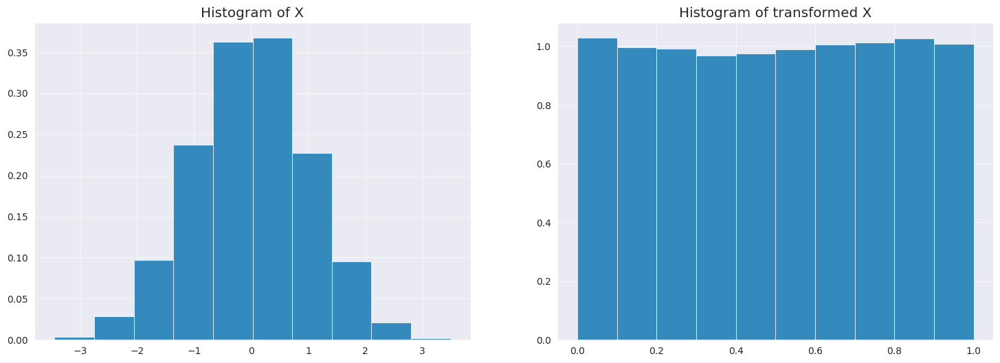

In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(121)
plt.hist(X, density=True, bins=10)
plt.title('Histogram of X')
plt.subplot(122)
plt.hist(X_transformed, density=True, bins=10)
plt.title('Histogram of transformed X')

In [ ]:
X = stats.uniform.rvs(size=10000)
X_transformed = stats.norm.ppf(X)

Text(0.5, 1.0, 'Histogram of transformed X')

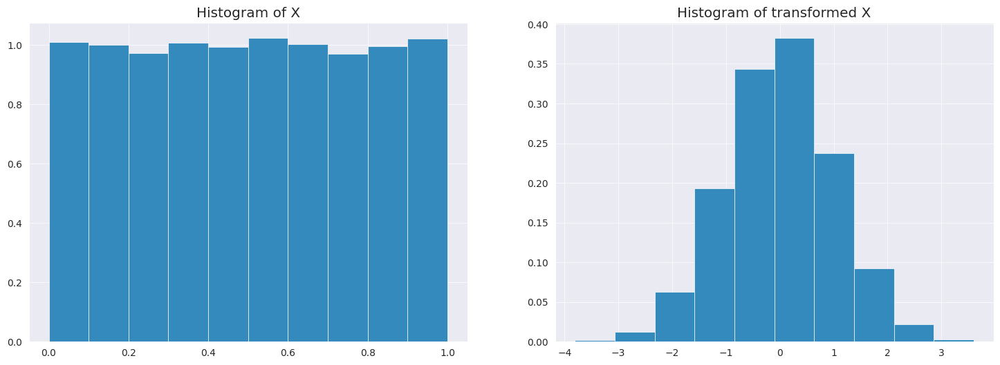

In [ ]:
plt.figure(figsize=(18,6))
plt.subplot(121)
plt.hist(X, density=True, bins=10)
plt.title('Histogram of X')
plt.subplot(122)
plt.hist(X_transformed, density=True, bins=10)
plt.title('Histogram of transformed X')

## Beta distribution
The probability density function (PDF) of the beta distribution, for $0 \leq x \leq 1$, and shape parameters $\alpha, \beta > 0$, is a power function of the variable $x$ and of its reflection $(1 − x)$ as follow:

$$f(x;\alpha ,\beta ) = \frac{x^{\alpha-1}(1-x)^{\beta-1}} {B(\alpha,\beta)}$$

In this point, our intention is to test various techniques for symbolic processing and simulation using Python. Since the beta distribution is well known, it has been considered a good example for testing python on:
* image (plotting) generation including interactive plots
* simulations
* symbolic treatment of equations

#### Relationship of the beta with the aggregated player
$X_1,X_2,\dots,X_d$ are $d$ i.i.d. uniform random variables. Let $Y=\min(X_1,X_2,\dots,X_d)$.
By definition, $F(y)=\mathbb{P}(Y\leq y)=1−\mathbb{P}(Y>y)=1−\mathbb{P}(\min(X_1,X_2,\dots,X_d)>y)$. Of course, $\min(X_1,X_2,\dots,X_d)>y$ exactly when $X_i>y$ for all $i$. Since these variables are i.i.d., we have

$$F(y)=\mathbb{P}(Y\leq y)=1−\mathbb{P}(X_1>y)\mathbb{P}(X_2>y)\dots \mathbb{P}(X_d>y)=1−\mathbb{P}(X_1>y)^d$$.

Assuming the $X_i$ are uniformly distributed on $(a,b)$, this yields
$$F(y) = \left\{
     \begin{array}{ll}
       1 - \left(\frac{b-y}{b-a}\right)^d & : y \in (a, b)\\
       0 & : y < a\\
       1 & : y > b
     \end{array}
\right.$$

We take the derivative to get the density function.
$$f(y) = \left\{
     \begin{array}{ll}
       \frac{d}{b-a} \left(\frac{b-y}{b-a}\right)^{d-1} & : y \in (a, b)\\
       0 & : \text{otherwise}
     \end{array}
\right.$$

if $a=0$, $b=1$ then:
$$F(y) = \left\{
     \begin{array}{ll}
       1 - \left(1-y\right)^d & : y \in (a, b)\\
       0 & : y < 0\\
       1 & : y > 1
     \end{array}
\right.$$
and
$$f(y) = \left\{
     \begin{array}{ll}
       d \left(1-y\right)^{d-1} & : y \in (0, 1)\\
       0 & : \text{otherwise}
     \end{array}
\right.$$

In the case of QPQ , we are interested in the probability that the aggregated player reports the value $y$ as the minimum value of all the players in the cluster. This corresponds to the probability that all the others players (in the cluster) have values greater than "y". In the case of two independent players and following uniforms, the probability is:

$$ \mathbb{P}(y=\min(u_2, \dots, u_d)) = \int_y^1\dots \int_y^1 f_{\neq u1}(u_2, \dots, u_d) \,du_2, \dots, \,du_d = (d-1)(1-y)^{(d-2)}$$

This can also be calculated directly without using the density functions, just using the CDFs.
$$F_{\neq u1}(y) = (d-1)\mathbb{P}(X_i > y)^{(d-2)} = (d-1)\left(1−\mathbb{P}(X_i \leq y)\right)^{(d-2)} = (d-1)(1-y)^{(d-2)}$$


NOTE that this probability corresponds to the PDF of the Beta distribution when $\alpha = 1$ and $\beta = (d-1)$

At some point we will be interested in knowing the probability mass that exists in a given region. This can also be calculated with CDFs. For example:

$$ \mathbb{P}(y=\min(u, v)) = \int_0^y \int_y^1 f(u, v) \,du\,dv + \int_0^y \int_y^1 f(u, v) \,dv \,du$$

if $f(x,y) = 1$,  $d=2$ then

$$\mathbb{P}(y) = \int_0^y \int_y^1  \,du \,dv + \int_0^y \int_y^1 \,dv \,du = \int_0^y (y-1) \,dv + \int_0^y (y-1)\,du = 2y(1−y) $$

Again, since these variables are i.i.d., we have
$$F(y) = \sum_1^d \mathbb{P}(X_i\leq y)\prod_{j \neq i}(1− \mathbb{P}(X_j > y))$$

or
$$F(y) = d\cdot \mathbb{P}(X_1\leq y)\left(1−\mathbb{P}(X_1 > y)\right)^{(d-1)}$$

As will be seen later, the intention is to use copulas to express these probabilities.

#### Analysis using SymPy

In [ ]:
from sympy.stats import Beta, density, E, variance
from sympy import Symbol, simplify, pprint, factor, lambdify

alpha = Symbol("alpha", positive = True)
beta = Symbol("beta", positive = True)
x = Symbol("x")

# Using sympy.stats.Beta() method
X = Beta("x", alpha, beta)
gfg = density(X)(x)
gfg

x**(alpha - 1)*(1 - x)**(beta - 1)/beta(alpha, beta)

In [ ]:
from sympy import integrate

u1 = Symbol("u1", positive = True)
u2 = Symbol("u2", positive = True)
u3 = Symbol("u3", positive = True)
z = Symbol("z", positive = True)
# Note the integration order in sympy.
fmin2 = integrate(1, (u2, z, 1), (u1, 0, z)) + integrate(1, (u1, z, 1), (u2, 0, z))
fmin2

2*z*(1 - z)

In [ ]:
fmin3 = simplify(integrate(1, (u3, z, 1), (u2, z, 1), (u1, 0, z)) + integrate(1, (u3, z, 1),(u1, z, 1), (u2, 0, z)) + integrate(1, (u1, z, 1),(u2, z, 1), (u3, 0, z)))
fmin3

3*z*(z**2 - 2*z + 1)

In [ ]:
fnplayers = simplify(gfg.subs([(alpha, 2), (beta, 3), (x, u2)]))
fnplayers

u2*(u2 - 1)**2/beta(2, 3)

In [ ]:
fmin2 = integrate(fnplayers, (u2, z, 1), (u1, 0, z)) + integrate(fnplayers, (u1, z, 1), (u2, 0, z))
simplify(fmin2)

z*(-6*z**4 + 19*z**3 - 20*z**2 + 6*z + 1)/(12*beta(2, 3))

#### Plotting using Panel

In [ ]:
# a panel to explore Beta distribution.
import panel as pn
import holoviews as hv

pn.extension(design='material')
alpha_widget = pn.widgets.EditableFloatSlider(name='Alpha', start=0, end=10, step=0.2, value=2)
beta_widget = pn.widgets.EditableFloatSlider(name='Beta', start=0, end=10, step=0.2, value=5)
@pn.depends(a=alpha_widget, b=beta_widget)
def plot_beta(a, b):
    xs = np.linspace(0,1)
    pr = lambdify(x, gfg.subs([(alphasymbol, a), (betasymbol, b)]), "numpy")
    points = [(i, pr(i)) for i in xs]
    return hv.Curve(points).opts(width=600, framewise=True)

bound_plot = pn.bind(plot_beta, a=alpha_widget, b=beta_widget)
beta_app =  pn.Row(pn.WidgetBox('## Beta Explorer', alpha_widget, beta_widget), bound_plot).servable()

beta_app

#### Plotting using matplotlib and scipy stats

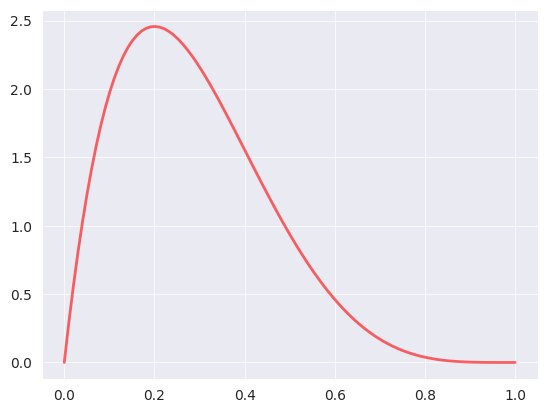

In [ ]:
from scipy.stats import beta
fig, ax = plt.subplots(1, 1)
a, b = 2, 5
x = np.linspace(0.0, 1.0, num=100)
ax.plot(x, beta.pdf(x, a, b),'r-', lw=2, alpha=0.6, label='beta pdf')
plt.show()

#### Simulating using matplotlib and scipy stats

[Text(0.5, 1.0, 'Histogram of B(2,5)'),
 Text(0.5, 0, 'Value'),
 Text(0, 0.5, 'Frequency')]

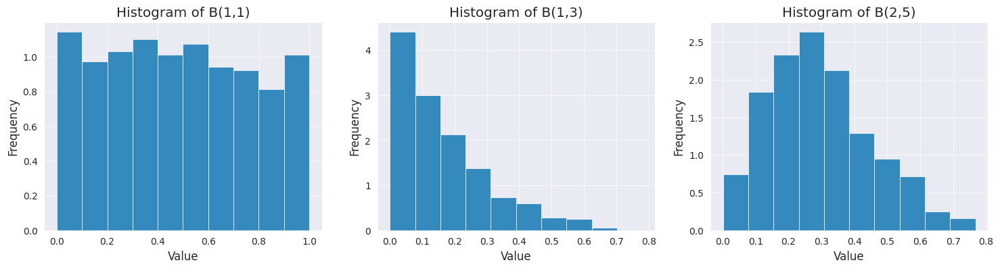

In [ ]:
samples = 1000
fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)
ax[0].hist(beta(1,1).rvs(size=samples), density=True)
ax[0].set(title='Histogram of B(1,1)', xlabel='Value', ylabel='Frequency')
ax[1].hist(beta(1,5).rvs(size=samples), density=True)
ax[1].set(title='Histogram of B(1,3)', xlabel='Value', ylabel='Frequency')
ax[2].hist(beta(2,5).rvs(size=samples), density=True)
ax[2].set(title='Histogram of B(2,5)', xlabel='Value', ylabel='Frequency')

#### Simulating the min of players' values

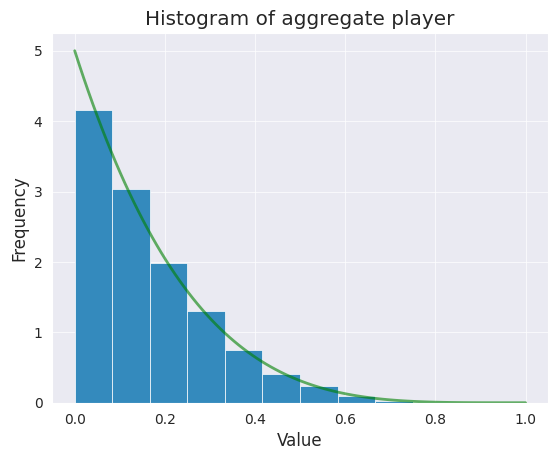

In [ ]:
from scipy.stats import uniform
from scipy.stats import beta
players = 5
samples = 10000
vals = np.empty(shape=[players, samples])
for p in range(players):
    vals[p,] = uniform.rvs(size=samples)

fig, ax = plt.subplots(1, 1)
ax.hist(vals.min(0), density=True)
ax.set(title='Histogram of aggregate player', xlabel='Value', ylabel='Frequency')
a, b = 1, players
x = np.linspace(0.0, 1.0, num=100)
ax.plot(x, beta.pdf(x, a, b),'g-', lw=2, alpha=0.6, label='beta pdf')
plt.show()

## Product copula (independent variables)

In [ ]:
dist_x = stats.uniform()
dist_y = stats.beta(1, 3)

In [ ]:
X = dist_x.rvs(size=10000)
Y = dist_y.rvs(size=10000)

[Text(0.5, 1.0, 'Scatterplot of X and Y'),
 Text(0.5, 0, 'X'),
 Text(0, 0.5, 'Y')]

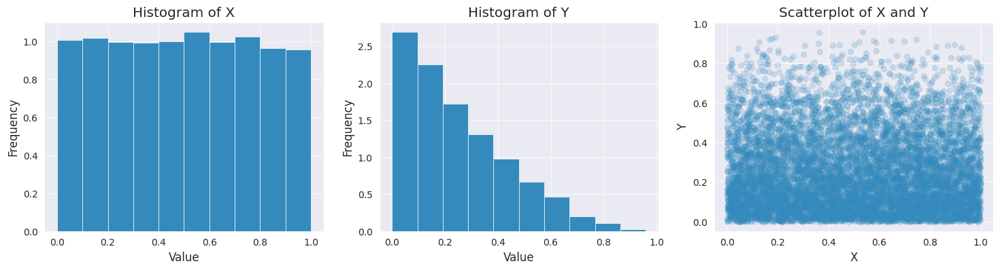

In [ ]:
fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)
ax[0].hist(X, density=True)
ax[0].set(title='Histogram of X', xlabel='Value', ylabel='Frequency')
ax[1].hist(Y, density=True)
ax[1].set(title='Histogram of Y', xlabel='Value', ylabel='Frequency')
ax[2].scatter(X,Y, alpha=0.2)
ax[2].set(title='Scatterplot of X and Y', xlabel='X', ylabel='Y')

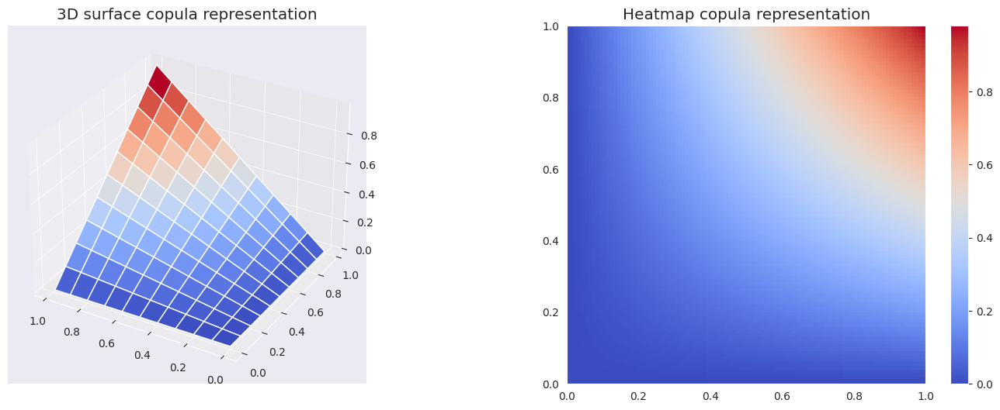

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

fig = plt.figure(figsize=(18,6))
ax0 = fig.add_subplot(121, projection='3d')
ax1 = fig.add_subplot(122)

x = np.arange(0,1,0.01)
y = np.arange(0,1,0.01)
x,y = np.meshgrid(x,y)

# apply inverse CDF to each point on a grid
pairs = np.array([[i, j] for (i,j) in zip(dist_x.ppf(x).flatten(),dist_y.ppf(y).flatten())])
# calculate the product of two CDFs for each point on a grid
z = dist_x.cdf(pairs[:,0]).reshape([100,100]) * dist_y.cdf(pairs[:,1]).reshape([100,100])

ax0.plot_surface(x, y, z, cmap=cm.coolwarm, rstride=10, cstride=10, linewidth=1)
#ax0.invert_yaxis()
ax0.invert_xaxis()
ax0.set(title='3D surface copula representation')
img = ax1.imshow(np.flip(z,axis=0), cmap=cm.coolwarm, extent=[0,1,0,1])
ax1.grid(False)
ax1.set(title='Heatmap copula representation')
fig.colorbar(img)

[Text(0.5, 1.0, 'Scatterplot of transformed X and Y'),
 Text(0.5, 0, 'X'),
 Text(0, 0.5, 'Y')]

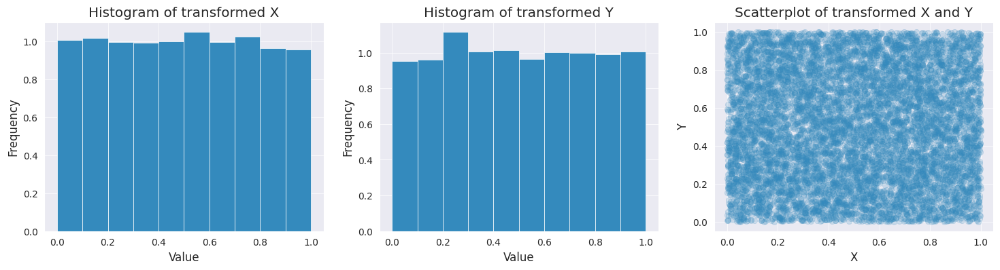

In [ ]:
fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)
ax[0].hist(dist_x.cdf(X), density=True)
ax[0].set(title='Histogram of transformed X', xlabel='Value', ylabel='Frequency')
ax[1].hist(dist_y.cdf(Y), density=True)
ax[1].set(title='Histogram of transformed Y', xlabel='Value', ylabel='Frequency')
ax[2].scatter(dist_x.cdf(X), dist_y.cdf(Y), alpha=0.2)
ax[2].set(title='Scatterplot of transformed X and Y', xlabel='X', ylabel='Y')

## Inclusion–exclusion principle in probability
(from wikipedia) In probability, for events $A_1,\cdots,A_n$ in a probability space $(\Omega ,{\mathcal {F}},\mathbb {P} )$, the inclusion–exclusion principle becomes for n = 2:
$${\mathbb  {P}}(A_{1}\cup A_{2})={\mathbb  {P}}(A_{1})+{\mathbb  {P}}(A_{2})-{\mathbb  {P}}(A_{1}\cap A_{2}),$$
for n = 3
$${\displaystyle \mathbb {P} (A_{1}\cup A_{2}\cup A_{3})=\mathbb {P} (A_{1})+\mathbb {P} (A_{2})+\mathbb {P} (A_{3})-\mathbb {P} (A_{1}\cap A_{2})-\mathbb {P} (A_{1}\cap A_{3})-\mathbb {P} (A_{2}\cap A_{3})+\mathbb {P} (A_{1}\cap A_{2}\cap A_{3})}$$
and in general
$${\displaystyle \mathbb {P} \left(\bigcup _{i=1}^{n}A_{i}\right)=\sum _{i=1}^{n}\mathbb {P} (A_{i})-\sum _{i<j}\mathbb {P} (A_{i}\cap A_{j})+\sum _{i<j<k}\mathbb {P} (A_{i}\cap A_{j}\cap A_{k})+\cdots +(-1)^{n-1}\sum _{i<...<n}\mathbb {P} \left(\bigcap _{i=1}^{n}A_{i}\right),}$$
which can be written in closed form as
$${\displaystyle \mathbb {P} \left(\bigcup _{i=1}^{n}A_{i}\right)=\sum _{k=1}^{n}\left((-1)^{k-1}\sum _{I\subseteq \{1,\ldots ,n\} \atop |I|=k}\mathbb {P} (A_{I})\right),}$$
where the last sum runs over all subsets I of the indices 1, …, n which contain exactly k elements, and $A_{I}:=\bigcap _{{i\in I}}A_{i}$ denotes the intersection of all those $A_i$ with index in $I$.

## Distribution of the aggregate player
### Independent uniform distribution
As we saw before, the aggregate player, representing $(d-1)$ players, will report values with probability:
.
$$F_{\neq u1}(y) = (d-1)P(X_i > y)^{(d-2)} = (d-1)\left(1−P(X_i \leq y)\right)^{(d-2)} = (d-1)(1-y)^{(d-2)}$$


     
### General case: correlated distribution without transformation
The copula of $(X_{1},X_{2},\dots ,X_{d})$ is defined as the joint cumulative distribution function of $(U_{1},U_{2},\dots ,U_{d})$:

$$ C(u_{1},u_{2},\dots ,u_{d})=\Pr[U_{1}\leq u_{1},U_{2}\leq u_{2},\dots ,U_{d}\leq u_{d}] $$,

where $U_i = F_i(X_i)$ is the marginal CDFs of $X_i$.
The probability of the aggregate player could be calculate using its copula.

For $Y=\min(U_1,\cdots,U_{d-1})$, we are interested in:
$$F_{Y}(y)= \mathbb{P}(Y \leqslant y)=\mathbb P(\min(U_1,\cdots,U_{d-1}) \leqslant y) \tag{1}$$

For two players:
$$
\begin{align*}
1 - F_{Y}(y) & = \mathbb{P}(\min(U_1,U_2)>y) \\
& = \mathbb{P}(U_1>y,U_2>y) \\
& = 1-(\mathbb{P}\left(U_1\leqslant y\right) +\mathbb{P}\left(U_2\leqslant y\right) - \mathbb{P}\left(U_1\leqslant y, U_2\leqslant y\right)) \\
& = 1- \left( F_1(y) + F_2(y) - C(y, y)\right)
\end{align*}$$

where the inclusion exclusion principle was applied to get the last equality. Thus:
$$F_{Y}(y) = F_1(y) + F_2(y) - C(y, y)$$

For three players:
$$\begin{align*}
F_{Y}(y) =\mathbb{P} (\min(U_1,U_2,U_3) \leq y) & = F_1(y)+F_2(y)+F_3(y) \\
& - C_{1,2}(y,y) - C_{1,3}(y,y) - C_{2,3}(y,y) \\
& + C(y,y,y)
\end{align*}$$

For $(d-1)$ players, and using the inclusion–exclusion principle:

$$
\begin{align*}
1-F_Y(y) & = \mathbb{P}(\min(U_1,\cdots,U_{d-1})>y) \\
& = \mathbb{P}(U_1>y,\cdots,U_{d-1}>y) \\
& = 1-(\sum _{k=1}^{d-1} \left( (-1)^{k-1} \sum _{1\leqslant i_{1}<\cdots < i_{k}\leqslant n}\mathbb{P}\left(U_{i_{1}}\leqslant y, \cdots, U_{i_{k}}\leqslant y\right)\right))
\end{align*}$$

or:
$$F_{Y}(y) = \sum _{k=1}^{d-1} \left( (-1)^{k-1} \sum _{1\leqslant i_{1}<\cdots < i_{k}\leqslant n}\mathbb{P}\left(U_{i_{1}}\leqslant y, \cdots, U_{i_{k}}\leqslant y\right)\right) \tag{2}$$


When $C(u_1,\cdots,u_{d-1}) = \prod_{i=1}^{d-1}u_i$, then

Pending ...

$$ \mathbb{P} (y) = (d-1)(1-y)^{(d-2)}$$
as expected for the independent copula.


### General case: correlated distribution with transformation
In this case, instead of $X_i$, we are using $\psi_i(X_i)$ and $U_i = F_i(\psi_i(X_i))$ is the marginal CDFs of $\psi_i(X_i)$.
For 2 and 3 players, the above expressions transform to:

$$F_{Y}(y) = F_1(\psi_1(y)) + F_2(\psi_2(y)) - C(\psi_1(y), \psi_2(y)) = \psi_1(y) + \psi_2(y) - C(y, y)$$

and
$$\begin{align*}
F_{Y}(y)  & = F_1(\psi_1(y))+F_2(\psi_2(y))+F_3(\psi_3(y)) \\
& - C_{1,2}(\psi_1(y),\psi_2(y)) - C_{1,3}(\psi_1(y),\psi_3(y)) - C_{2,3}(\psi_2(y),\psi_3(y)) \\
& + C(\psi_1(y),\psi_3(y),\psi_3(y)) \\
& = \psi_1(y) + \psi_2(y) + \psi_3(y)  - 3 C(y, y) + C(y,y,y)
\end{align*}$$

In general (**REVISAR Y SIMULAR**):
$$F_{Y}(y) = \sum _{i=1}^{d-1} \psi_i(y)  + \sum _{k=2}^{d-1} \left( (-1)^{k-1} \binom{d-1}{k} C_k\left(y, \cdots, y\right)\right) \tag{3}$$

Some references:
* http://scik.org/index.php/jmcs/article/view/5932
* https://www.casact.org/sites/default/files/old/02pcas_venter.pdf
* https://cran.r-project.org/web/packages/copBasic/copBasic.pdf
* https://stats.stackexchange.com/questions/124865/sampling-from-conditional-copula
* https://math.stackexchange.com/questions/308230/expectation-of-the-min-of-two-independent-random-variables
* https://en.wikipedia.org/wiki/Inclusion%E2%80%93exclusion_principle

## Copula of the aggregate player

The question we want to answer is how to express the correlation structure of $U_{a}$ as a function of the other variables $U_i$. It is possible that for some cases the correlation structure remains unchanged and the same copula can be used. And if true, in which cases can it be said that the copula remains the same?


### Contexto
Lo que he estado intentando hacer estos días, ha sido buscar la forma de relacionar $\pi$ con $\pi_a$ y tener la densidad del agregado $f_a$
En estos momentos, tenemos la seguridad de que conocemos $F_a$, pero sigo dudando sobre cómo tratar $\pi_a$, $C_a$ o $c_a$

Lo que estoy buscando es poder expresar la ecuación de justicia de QPQ con varios jugadores usando la copula de un jugador agregado. Normalmente, expresamos la justifica de la siguiente forma:

$$\displaystyle{\displaystyle{\int_0^1 \lambda(\theta) \int_{\psi_2(\theta_1)}^1
\int_{\psi_3(\theta_1)}^1 \pi(\theta_1,\theta_2,\theta_3) \mathrm{d}\theta_3 \mathrm{d}\theta_2 \mathrm{d}\theta_1 = \int_0^1 \lambda(\theta) \int_{\psi_2(\theta_1)}^1\int_{\psi_3(\theta_1)}^1 \mathrm{d}H(\theta_1,\theta_2,\theta_3)}}$$

Donde $H$ es la CDF de $\theta$ y $\lambda(\theta)$ suele ser $\lambda(\theta) = \theta_1$ o $\lambda(\theta) = 1$ según busquemos la justicia en esfuerzo o en número de tareas respectivamente.

If $H$ is given by a copula model $C$, i.e.,

$$H(\theta_1,\theta_2,\theta_3)=C(F_{1}(\theta_{1}), F_{2}(\theta_{2}), F_{3}(\theta_{3}))$$

the quantity of interest can thus be written as:
$${\displaystyle \operatorname {E} \left[\lambda(X_{1},X_{2},X_{3})\right]=\int _{[0,1]^{d}}\lambda(F_{1}^{-1}(u_{1}),F_{2}^{-1}(u_{2}) ,F_{3}^{-1}(u_{3}))\,\mathrm {d} C(u_{1},u_{2},u_{3}).}$$

In case the copula $C$ is absolutely continuous, i.e. $C$ has a density c, this equation can be written as

$${\displaystyle \operatorname {E} \left[\lambda(X_{1},X_{2},X_{3})\right]=\int _{[0,1]^{d}}\lambda(F_{1}^{-1}(u_{1}),\dots ,F_{d}^{-1}(u_{d}))\cdot c(u_{1},\dots ,u_{d})\,du_{1}\cdots \mathrm {d} u_{d},}$$

and if each marginal distribution has the density $f_{i}$ it holds further that

$${\displaystyle \operatorname {E} \left[\lambda(X_{1},X_{2},X_{3})\right]=\int _{\mathbb {R} ^{d}}\lambda(x_{1},x_{2}, x_{3})\cdot c(F_{1}(x_{1}),F_{2}(x_{2}),F_{3}(x_{3}))\cdot f_{1}(x_{1})\cdot f_{2}(x_{2}) \cdot f_{3}(x_{3}) \,\mathrm {d} x_{1} \mathrm {d} x_{2} \mathrm {d} x_{3}.}$$

Si suponemos que $x_i$ es un valor normalizado por la PIT, entonces $\theta_i = x_i = u_1$, $f_i = 1$:
$${\displaystyle \operatorname {E} \left[\lambda(X_{1},X_{2},X_{3})\right]=\int _{\mathbb {R} ^{3}}\lambda(\theta_{1}, \theta_{2}, \theta_{3})\cdot c(\theta_{1},\theta_{2},\theta_{3})\,\mathrm {d} \theta_{1} \,\mathrm{d} \theta_{2} \mathrm {d} \theta_{3}.} \tag{H1}$$

En el caso del número de tareas, la expresión anterior se convierte en:
 $${\displaystyle \operatorname {E} \left[\lambda_{T}(X_{1},X_{2},X_{3})\right]= \int_0^1 \int_{\psi_2(\theta_1)}^1
\int_{\psi_3(\theta_1)}^1 c(\theta_1,\theta_2,\theta_3) \,\mathrm{d}\theta_3 \mathrm{d}\theta_2 \mathrm{d}\theta_1} $$

Y si fuera el esfuerzo:
 $${\displaystyle \operatorname {E} \left[\lambda_{E}(X_{1},X_{2},X_{3})\right]= \int_0^1 \theta_1 \int_{\psi_2(\theta_1)}^1
\int_{\psi_3(\theta_1)}^1 c(\theta_1,\theta_2,\theta_3) \,\mathrm{d}\theta_3 \mathrm{d}\theta_2 \mathrm{d}\theta_1} $$

### Formulación

Lo que estamos buscando es sustituir los jugadores 2 y 3 por un jugador agregado ficticio que declara valores según una variable aleatoria $\Theta_a$ y la estructura de correlación entre el jugador agregado y el jugador 1 se expresa mediante $C_{a}(\theta_1, \theta_a)$.

Por el teorema de Sklar
$$H(u_1, \cdots, x_d ) = C(F_1(x_1), \cdots, F_d (x_d ))$$

y, como el jugador agregado sigue una distribución $F_a$, lo que estamos diciendo es que $\theta_a = F_a(x_a)$ y que $x_a = \min(x_2,\cdots,x_d)$. Abusando de la notación y considerando que los jugadores tienen marginales uniformes $x_i = \theta_i$ y $x_a = \min(\theta_2,\cdots,\theta_d)$

Por lo tanto, la copula del agregado sera:
$$C_a(\theta_1, \theta_a) = C_a(F_1(\theta_1), F_a(x_a)) = \theta_1 \cdot \theta_a = \theta_1 \cdot F_a(x_a)$$

y la condicional será:

$$\frac{\partial}{\partial \theta_1}C_a(\theta_1, \theta_a) = f_{a}(\theta_a) c_a(\theta_1, \theta_a) = \theta_a c_a(\theta_1, \theta_a) =  F_a(x_a) c_a(\theta_1, \theta_a)$$

---


Según lo anterior, la ecuacion de justicia se convertiría en:

$${\displaystyle \operatorname {E} \left[\lambda(X_{1},X_{a})\right] = \int_0^1 \int_{\psi_a(\theta_1)}^1 \lambda(\theta_{1}, \theta_{a}) \cdot f_{a}(\theta_{a}) \cdot c_a(\theta_1, \theta_a) \,\mathrm{d}\theta_a \mathrm{d}\theta_1 = \int_0^1 \int_{\psi_a(\theta_1)}^1 \lambda(\theta_{1}, \theta_{a}) \cdot F_a(x_a) \cdot c_a(\theta_1, F_a(x_a)) \,\mathrm{d}x_a \mathrm{d}\theta_1} \tag{H2}$$

Por ejemplo, la expresión anterior se simplificaría en el caso de justicia por número de tareas:
  $${\displaystyle \operatorname {E} \left[\lambda_{T}(X_{1},X_{a})\right]= \int_0^1 \int_{\psi_a(\theta_1)}^1 \theta_{a} \cdot c_a(\theta_1, \theta_a) \,\mathrm{d}\theta_a \mathrm{d}\theta_1 = \int_0^1 \int_{\psi_a(\theta_1)}^1 F_{a}(x_{a}) \cdot c_a(\theta_1, F_a(x_a)) \,\mathrm{d}x_a \mathrm{d}\theta_1} $$

Por lo tanto, la pregunta es ¿Cuál sería la forma correcta de $C_a$?
    


### Demostración sin transformadas
Si se cumple que las siguientes probabilidades son iguales, entonces las ecuaciones H1 y H2 anteriores serían equivalentes:

$${\displaystyle \mathbb{P}[\Theta_{2} > \psi_{2}(\theta_1),\Theta_{3} > \psi_{3}(\theta_1)| \Theta_1 = \theta_1] =  \mathbb{P}[\Theta_{a} > \psi_{a}(\theta_1)| \Theta_1 = \theta_1]}. \tag{H3}$$

sabemos que
$$\mathbb{P}[X < x | Y=y] = \frac{\mathbb{P}[X < x, Y=y]}{\mathbb{P}[Y=y]} = \frac{\frac{\partial}{\partial y} C(F(x), G(y)) \cdot g(y)}{g(y)} = \frac{\partial}{\partial y} C(F(x), G(y))$$


Por lo tanto, el lado derecho de la ecuación H3 se podría expresar como:
$$\begin{align*}
\mathbb{P}[\Theta_{a} > \theta_1| \Theta_1 = \theta_1] & = 1 - \mathbb{P}[\Theta_{a} \leqslant \theta_1| \Theta_1 = \theta_1] \\
& = 1 - \frac{\partial}{\partial \theta_1} C_a(\theta_1, \theta_1) \\
& = 1 - f_1(\theta_1) \cdot f_a(\theta_1) \cdot c_a(\theta_1, \theta_1) \\
& = 1 - F_a(\theta_1) \cdot c_a(\theta_1, \theta_1)
\end{align*}$$

Y el lado izquierdo de H3 sería:
$$\begin{align*}
\mathbb{P}[\Theta_{2} > \theta_1,\Theta_{3} > \theta_1| \Theta_1 = \theta_1]  & = 1 - \left( \mathbb{P}[\Theta_{2} \leqslant \theta_1, \Theta_{3} \leqslant 1| \Theta_1 = \theta_1]+ \mathbb{P}[\Theta_{2} \leqslant  1, \Theta_{3} \leqslant \theta_1| \Theta_1 = \theta_1]- \mathbb{P}[\Theta_{2} \leqslant \theta_1,\Theta_{3} \leqslant \theta_1| \Theta_1 = \theta_1]\right) \\
& = 1 - \left(\frac{\partial}{\partial \theta_1} C(F_1(\theta_1), F_2(\theta_1), 1) + \frac{\partial}{\partial \theta_1} C(F_1(\theta_1), 1, F_3(\theta_1)) - \frac{\partial}{\partial \theta_1} C(F_1(\theta_1), F_2(\theta_1), F_3(\theta_1))\right) \\
& = 1 - \left(  f_1(\theta_1) \cdot f_2(\theta_1) \cdot c(F_1(\theta_1), F_2(\theta_1), 1) +  f_1(\theta_1) \cdot f_3(\theta_1) \cdot c(F_1(\theta_1), 1, F_3(\theta_1)) - f_1(\theta_1) \cdot f_2(\theta_1)  \cdot f_3(\theta_1)  \cdot c(F_1(\theta_1), F_2(\theta_1), F_3(\theta_1))\right)  \\
& = 1 - \left( c(F_1(\theta_1), F_2(\theta_1), 1) + c(F_1(\theta_1), 1, F_3(\theta_1))- c(F_1(\theta_1), F_2(\theta_1), F_3(\theta_1))\right) \\
& = 1 - \left(c_{1,2}(\theta_1, \theta_1) + c_{1,3}(\theta_1, \theta_1) - c(\theta_1, \theta_1, \theta_1)\right)
\end{align*}$$

para llegar a esos resultados he aplicado la regla de la cadena y el supuesto de que los jugadores tienen una marginal uniforme.

Por lo tanto, la ecuación H3 se puede escribir como:

$$1 - \left(c_{1,2}(\theta_1, \theta_1) + c_{1,3}(\theta_1, \theta_1) - c(\theta_1, \theta_1, \theta_1)\right) = 1 - F_a(\theta_1) \cdot c_a(\theta_1, \theta_1)$$

y sabemos que:
$$F_{m}(y) = F_1(y) + F_2(y) - C(y, y)$$

**REVISAR** No me lo creo. La conclusión es que la copula se corresponde con una de independientes.

---



Otro planteamiento sería intentar usar la intución que aportan las copulas anidadas. Por ejemplo, para la familia de Archimedean Copulas:
$$C(u_1, \cdots, u_d; ψ_0, \cdots, ψ_{d-2}) = \psi_0(\psi_0^{-1}(u_1) + \psi_0^{-1}(C(u_2, \cdots,, u_d; \psi_1, \cdots,, \psi_{d-2}))$$

Con los supuestos habituales, en el caso de tres jugadores se puede expresar como
$$C(u_1, u_2, u_3; \psi_0) = C(u_1, C(u_2, u_3; \psi_0); \psi_0))$$

$$\psi_0(\psi_0^{-1}(u_1) + \psi_0^{-1}(u_2) + \psi_0^{-1}(u_3)) = \psi_0(\psi_0^{-1}(u_1) + \psi_0^{-1}(\psi_0( \psi_0^{-1}(u_2) + \psi_0^{-1}(u_3))))$$

De la expresión anterior, se puede observar que parece posible transformar $u_2, u_3$ de forma independiente a $u_1$ sin alterar la transformada $\psi_0$ y por tanto, la copula raiz  que los une.

Cuando sustituimos los jugadores 2 y 3 por el agregado $u_a$$ ¿Se podría decir que lo siguiente es cierto?

$$  C_m(u_1,\min(u_2,u_3)) = \psi_0(\psi_0^{-1}(u_1) + \psi_0^{-1}(\min(u_2,u_3))) = \psi_0(\psi_0^{-1}(u_1) + \psi_0^{-1}(u_a)) = C(u_1, u_a; \psi_0)$$

Y esto último podría justificar la hipotesis de la relación entre el jugador 1 y el agregado sigue el mismo modelo de correlación que tenía el jugador 1 con el resto de los jugadores. También justificaría las simulaciones realizadas. Tendría que simular algún caso diferente de la familia de archimedes a ver si también se cumple para copulas generales.

A esto último le veo sentido, pero no tiene el rigo matemático necesario. ¿Es cierto lo que digo?

### Demostración con transformadas
**PENDIENTE**

<!--
Si se cumple que las siguientes probabilidades son iguales, entonces las ecuaciones H1 y H2 anteriores serían equivalentes:

$${\displaystyle \mathbb{P}[\Theta_{2} > \psi_{2}(\theta_1),\Theta_{3} > \psi_{3}(\theta_1)| \Theta_1 = \theta_1] =  \mathbb{P}[\Theta_{a} > \psi_{a}(\theta_1)| \Theta_1 = \theta_1]}. \tag{H3}$$

sabemos que
$$\mathbb{P}[X < x | Y=y] = \frac{\mathbb{P}[X < x, Y=y]}{\mathbb{P}[Y=y]} = \frac{\frac{\partial}{\partial y} C(F(x), G(y)) \cdot g(y)}{g(y)} = \frac{\partial}{\partial y} C(F(x), G(y))$$

**(IMPORTANTE REVISAR MUY A FONDO LO SIGUIENTE!!)**

Por lo tanto, el lado derecho de la ecuación H3 se podría expresar como:
$$\begin{align*}
\mathbb{P}[\Theta_{a} > \psi_{a}(\theta_1)| \Theta_1 = \theta_1] & = 1 - \mathbb{P}[\Theta_{a} \leqslant \psi_{a}(\theta_1)| \Theta_1 = \theta_1] \\
& = 1 - \frac{\partial}{\partial \theta_1} C_a(F_1(\theta_1), F_a(\psi_{a}(\theta_1))) \\
& = 1 - f_1(\theta_1) \cdot f_a(\psi_{a}(\theta_1))  \cdot \psi_{a}^{'}(\theta_1) \cdot c_a(F_1(\theta_1), F_a(\psi_{a}(\theta_1))) \\
& = 1 - f_a(\psi_{a}(\theta_1))  \cdot \psi_{a}^{'}(\theta_1) \cdot c_a(\theta_1, F_a(\psi_{a}(\theta_1)))
\end{align*}$$

Y el lado izquierdo de H3 sería:
$$\begin{align*}
\mathbb{P}[\Theta_{2} > \psi_{2}(\theta_1),\Theta_{3} > \psi_{3}(\theta_1)| \Theta_1 = \theta_1]  & = 1 - \left( \mathbb{P}[\Theta_{2} \leqslant \psi_{2}(\theta_1), \Theta_{3} \leqslant 1| \Theta_1 = \theta_1]+ \mathbb{P}[\Theta_{2} \leqslant  1, \Theta_{3} \leqslant \psi_{3}(\theta_1)| \Theta_1 = \theta_1]- \mathbb{P}[\Theta_{2} \leqslant \psi_{2}(\theta_1),\Theta_{3} \leqslant \psi_{3}(\theta_1)| \Theta_1 = \theta_1]\right) \\
& = 1 - \left(\frac{\partial}{\partial \theta_1} C(F_1(\theta_1), F_2(\psi_{2}(\theta_1)), 1)) + \frac{\partial}{\partial \theta_1} C(F_1(\theta_1), 1, F_3(\psi_{3}(\theta_1))) - \frac{\partial}{\partial \theta_1} C(F_1(\theta_1), F_2(\psi_{2}(\theta_1)), F_3(\psi_{3}(\theta_1)))\right) \\
& = 1 - \left(  f_1(\theta_1) \cdot f_2(\psi_{2}(\theta_1))  \cdot \psi_{2}^{'}(\theta_1) \cdot c(F_1(\theta_1), F_2(\psi_{2}(\theta_1)), 1)) +  f_1(\theta_1) \cdot f_3(\psi_{3}(\theta_1)  \cdot \psi_{3}^{'}(\theta_1) \cdot c(F_1(\theta_1), 1, F_3(\psi_{3}(\theta_1))) - f_1(\theta_1) \cdot f_2(\psi_{2}(\theta_1))  \cdot \psi_{2}^{'}(\theta_1) \cdot f_3(\psi_{3}(\theta_1)  \cdot \psi_{3}^{'}(\theta_1) \cdot c(F_1(\theta_1), F_2(\psi_{2}(\theta_1)), F_3(\psi_{3}(\theta_1)))\right)  \\
& = 1 - \left( \psi_{2}^{'}(\theta_1) \cdot c(F_1(\theta_1), F_2(\psi_{2}(\theta_1)), 1) + \psi_{3}^{'}(\theta_1) \cdot c(F_1(\theta_1), 1, F_3(\psi_{3}(\theta_1)))- \psi_{2}^{'}(\theta_1) \cdot \psi_{3}^{'}(\theta_1) \cdot c(F_1(\theta_1), F_2(\psi_{2}(\theta_1)), F_3(\psi_{3}(\theta_1)))\right) \\
& = 1 - \left(\psi_{2}^{'}(\theta_1) \cdot c_{1,2}(\theta_1, \psi_{2}(\theta_1)) + \psi_{3}^{'}(\theta_1) \cdot c_{1,3}(\theta_1, F_3(\psi_{3}(\theta_1)) - \psi_{2}^{'}(\theta_1) \cdot \psi_{3}^{'}(\theta_1) \cdot c(\theta_1, \psi_{2}(\theta_1), \psi_{3}(\theta_1))\right)
\end{align*}$$

para llegar a esos resultados he aplicado la regla de la cadena y el supuesto de que los jugadores tienen una marginal uniforme.

Por lo tanto, la ecuación H3 se puede escribir como:

$$ f_a(\psi_{a}(\theta_1))  \cdot \psi_{a}^{'}(\theta_1) \cdot c_a(\theta_1, F_a(\psi_{a}(\theta_1))) = \psi_{2}^{'}(\theta_1) \cdot c_{1,2}(\theta_1, \psi_{2}(\theta_1)) + \psi_{3}^{'}(\theta_1) \cdot c_{1,3}(\theta_1, F_3(\psi_{3}(\theta_1)) - \psi_{2}^{'}(\theta_1) \cdot \psi_{3}^{'}(\theta_1) \cdot c(\theta_1, \psi_{2}(\theta_1), \psi_{3}(\theta_1))$$


Si suponemos que las funciones $\psi_{i}$ tienen forma lineal $\psi_{i} (\theta_1) = \alpha_i \theta_1 + \beta_i$ entonces $\psi_{i}^{'}(\theta_1) = \alpha_i$ y por lo tanto:

$$ \alpha_a \cdot f_a(\psi_{a}(\theta_1))  \cdot c_a(\theta_1, F_a(\psi_{a}(\theta_1))) = \alpha_2 \cdot c_{1,2}(\theta_1, F_2(\psi_{2}(\theta_1))) + \alpha_3 \cdot c_{1,3}(\theta_1, F_3(\psi_{3}(\theta_1))) - \alpha_2 \cdot \alpha_3 \cdot c(\theta_1, F_2(\psi_{2}(\theta_1)), F_3(\psi_{3}(\theta_1)))$$



Por el teorema sobre la aplicacion de Strictly increasing transformations y dado que $\psi_{i}$ tienen forma lineal, entonces podríamos decir que es cierto que (**por comprobar**?):

$$ \alpha_a \cdot f_a(\psi_{a}(\theta_1))  \cdot c_a(\theta_1, F_a(\psi_{a}(\theta_1))) = \alpha_2 \cdot c_{1,2}(\theta_1, \theta_1) + \alpha_3 \cdot c_{1,3}(\theta_1, \theta_1) - \alpha_2 \cdot \alpha_3 \cdot c(\theta_1,\theta_1, \theta_1)$$

\
Por comprobar, pero dado que se ha supuesto que los jugadores 2 y 3 son indistinguibles $\alpha_2 = \alpha_3 = \alpha$ quizás también podría ser cierto que:
$$\alpha_a \cdot  f_a(\psi_{a}(\theta_1))  \cdot c_a(\theta_1, \theta_1) = 2\alpha \cdot c(\theta_1, \theta_1) - \alpha^2 \cdot c(\theta_1, \theta_1, \theta_1)$$

**¿Se podría reducir aún más? ¿Es verdad?**

Quizás esto podría comprobarlo mediante simulación

Sabiendo esto, ¿podemos abordar las ecuaciones de QPQ o nos falta algo más?
-->
Propongo que los próximos pasos sean:
*   aplicar las fórmulas anteriores a casos concretos (independientes, Gumbel, etc.) y comprobar que tienen sentido
*   intentar usar esas ecuaciones en QPQ y ver si se pueden obtener conclusiones de forma general o con ejemplos concretos
*   buscar la forma de $f_a(\psi_{a}(\theta))$
*   hacer simulaciones que lo comprueben. ¿Qué y cómo debería simular esto para estar seguro de que es correcto?

### Casos particulares

#### Caso 1: copula independiente sin transformadas
Como ejemplo concreto, si los jugadores son independientes e indistinguibles, entonces no existen transformadas $\psi_{i}$, solo se calcula el $\min(\theta_1, \theta_2, \theta_3)$. Hagamos de nuevo las ecuaciones pero aplicando las suposiciones.

Sabemos que por ser independientes:
$$C(\theta_1, \theta_2, \theta_3) = \theta_1 \cdot \theta_2 \cdot \theta_3$$
y
$$\frac{\partial}{\partial \theta_1}C(\theta_1, \theta_2, \theta_3) = \theta_2 \cdot \theta_3$$

Nota: No confundir con la densidad de la copula que en el caso de independientes es:

$$c(\theta_1, \theta_2, \theta_3) = 1$$

Si la hipótesis es correcta, el jugador 1 tendría la misma estructura de correlación con el agregador agregado. En este caso, se comportan como jugadores independientes y por lo tanto su copula sería:

$$C_a(\theta_1, \theta_a) = \theta_1 \cdot \theta_a$$
donde $\theta_a$ es el valor declarado por el jugador agregado.

Por el teorema de Sklar
$$H(u_1, \cdots, x_d ) = C(F_1(x_1), \cdots, F_d (x_d ))$$

y, como el jugador agregado sigue una distribución $F_a$, lo que estamos diciendo es que $\theta_a = F_a(x_a)$ y que $x_a = \min(x_2,\cdots,x_d)$. Abusando de la notación y considerando que los jugadores tienen marginales uniformes $x_i = \theta_i $ y $x_a = \min(\theta_2,\cdots,\theta_d)$

Por lo tanto, la copula del agregado sera:
$$C_a(\theta_1, \theta_a) = C_a(F_1(\theta_1), F_a(x_a)) = \theta_1 \cdot \theta_a = \theta_1 \cdot F_a(x_a)$$

y la condicional será:

$$\frac{\partial}{\partial \theta_1}C_a(\theta_1, \theta_a) = f_{a}(\theta_a) c_a(\theta_1, \theta_a) = \theta_a c_a(\theta_1, \theta_a) =  F_a(x_a) c_a(\theta_1, \theta_a)$$

<!--
$$C_a(u_1, u_a) = u_1 \cdot u_a = C_a(F_1(\theta_1), F_a(\theta_a)) = \theta_1 \cdot F_a(\theta_a)$$
y
$$\frac{\partial}{\partial u_1}C_a(u_1, u_a) = u_a = \frac{\partial}{\partial \theta_1}C_a(\theta_1, F_a(\theta_a)) = F_a(\theta_a)$$ -->

La ecuación de la izquierda de H3 sería:

$$\begin{align*}
\mathbb{P}[\Theta_{2} > \theta_1,\Theta_{3} > \theta_1| \Theta_1 = \theta_1]  & = 1 - \left(  \mathbb{P}[\Theta_{2} \leqslant \theta_1,\Theta_{3} \leqslant 1| \Theta_1 = \theta_1] +  \mathbb{P}[\Theta_{2} \leqslant 1,\Theta_{3} \leqslant \theta_1| \Theta_1 = \theta_1] -\mathbb{P}[\Theta_{2} \leqslant \theta_1,\Theta_{3} \leqslant \theta_1| \Theta_1 = \theta_1]  \right) \\
& = 1 - \left( \frac{\partial}{\partial \theta_1} C(\theta_1, \theta_1, 1) + \frac{\partial}{\partial \theta_1} C(\theta_1, 1, \theta_1) - \frac{\partial}{\partial \theta_1} C(\theta_1, \theta_1, \theta_1) \right) \\
& = 1 - 2 \theta_1 + \theta_1^2 \\
&= (1 - \theta_1)^2
\end{align*}$$

Que coincide si lo calculamos utilizando integrales:
$$F_{2.3}(\theta) = \int_{\theta_1}^1 \int_{\theta_1}^1 \pi(\theta_1,\theta_2,\theta_3) \mathrm{d}\theta_3 \mathrm{d}\theta_2 =  \int_{\theta_1}^1 \int_{\theta_1}^1 1 \mathrm{d}\theta_3 \mathrm{d}\theta_2 = (1 - \theta_1)^2 = 1 - 2\theta_1 + \theta_1^2$$

Recordad que lo anterior es la CDF y que la PDF sería:
$$f_{1,2}(\theta_1) = 2(1 - \theta_1)$$

El lado de la derecha de H3 usando copulas sería:
$$\begin{align*}
\mathbb{P}[\Theta_{a} > \theta_1| \Theta_1 = \theta_1] & = 1 - \mathbb{P}[\Theta_{a} \leqslant \theta_1| \Theta_1 = \theta_1] \\
& = 1 - \frac{\partial}{\partial \theta_1} C_a(\theta_1, \theta_1) \\
& = 1 - F_a(\theta_1) c_a(\theta_1, \theta_1)
\end{align*}$$

Como deseamos que H3 sea cierta, es decir que:
$$\begin{align*}
\mathbb{P}[\Theta_{2} > \theta_1,\Theta_{3} > \theta_1| \Theta_1 = \theta_1]
= \mathbb{P}[\Theta_{a} > \theta_1| \Theta_1 = \theta_1]
\end{align*}$$

Entonces debe ser cierto que:
$$\begin{align*}
(1- \theta_1)^2 = 1 - F_a(\theta_1) c_a(\theta_1, \theta_1)
\end{align*}$$

reordenando:
$$\begin{align*}
c_a(\theta_1, \theta_1) F_a(\theta_1) = 1 - (1- \theta_1)^2
\end{align*}$$

Sabemos que
$$F_m(y)=\mathbb{P}(Y \leqslant y)= 1 - (1- y)^2$$

Por lo tanto, ¿podemos confirmar que es cierto que?:
$$c_a(\theta_1, \theta_a) \cdot \left(1 - (1- \theta_1)^2\right) =1 - (1- \theta_1)^2$$

y eso solo es cierto si: $c_a(\theta_1, \theta_1) = 1$ como queríamos demostrar.

NOTA: en realidad queríamos demostrar que $c_a(\theta_1, \theta_a) = 1$ para todo $\theta_1$ y $\theta_a$. Esto valdría?

#### Caso 2: copula independiente con transformadas lineales

#### Case 3: Archimedean copulas without transformation
**Pendiente de tratar. No leer**

At this point we must decide if we define the aggregate player using the random variables $X_{1}$ as $X_a=\min(X_2,\cdots,X_{d})$ or their associates  $U_i$ as  $U_a=\min(U_2,\cdots,U_{d})$

Since we are going to consider that players always declare their PIT values, we can work only with the variables $U_{i}$ and use the definition of the aggregate player as $U_a=\min(U_2,\cdots,U_{d})$.

$U_a$ is the random variable that represents the minimun value of the $d-1$ dimensional random vector $(U_2,\cdots,U_{d})$. Its CDF is $F_a(y)$. Then the copula of $(U_1, U_a)$ is defined as:
$${\displaystyle C_{1,a}(u_{1},u_{a})=\mathbb{P}[U_{1}\leq u_{1},U_{a}\leq u_{a}].} \tag{D2}$$


If we replace $d-1$ players by its aggregated player $Y=\min(U_2,\cdots,U_{d-1})$ then the problem could be reduced to working with the aggregated copula:
$$C_{1,a}(u_1, y) = C_{1,a}(u_1, \min(u_2,\cdots,u_{d-1}))$$

In the case of the Archimedean copulas, we are working with a $d$-dimensional copula such as
$${\displaystyle C(u_{1},\dots ,u_{d};\theta )=\psi \left(\psi^{-1} (u_{1};\theta )+\cdots +\psi^{-1} (u_{d};\theta ) \right)}$$

Using the aggregated player allows to simplify QPQ formulation to two players with a copula such as:

$$C_{1,a}(u_1, y) = \psi_m(\psi_m^{-1}(u_1;\theta_m ) + \psi_m^{-1}(y;\theta_m)) \tag{3}$$

## Nested Archimedean copulas

At some point, I would like to plug Archimedean copulas into each other. This is call "Nested Archimedean copulas" or "Hierarchical Archimedean copulas". Nested copulas can be modeled by a hierarchical structure of Archimedean copulas, obtained by plugging in Archimedean copulas into each other. Nested Archimedean copulas recently gained interest since they generalize the well-known class of Archimedean copulas to allow for **partial asymmetry**.

In the general case:

$$C(u_1, \cdots, u_d; ψ_0, \cdots, ψ_{d-2}) = \psi_0(\psi_0^{-1}(u_1) + \psi_0^{-1}(C(u_2, \cdots,, u_d; \psi_1, \cdots,, \psi_{d-2}))$$


(From R document) Note that the structure of a nested Archimedean copula can be depicted by a tree. For example,the three-dimensional nested Archimedean copula involving the generators $\psi_0$ and $\psi_1$, which is given by
$$C(u_1, u_2, u_3) = C(u_1, C(u_2, u_3; ψ_1); ψ_0)$$

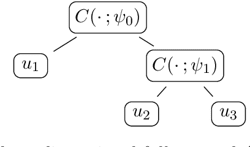



References:
* https://cran.rstudio.com/web/packages/copula/vignettes/nacopula-pkg.pdf

# Archimedean copulas

A copula C is called Archimedean if it admits the representation:
$${\displaystyle C(u_{1},\dots ,u_{d};\theta )=\psi ^{[-1]}\left(\psi (u_{1};\theta )+\cdots +\psi (u_{d};\theta );\theta \right)}$$

Some time, we use intead the following notation:
$${\displaystyle C(u_{1},\dots ,u_{d};\theta )=\psi\left(\psi^{-1} (u_{1};\theta )+\cdots +\psi^{-1}  (u_{d};\theta );\theta \right)}$$
\
A bivariate Archimedean copula induces a binary operator
$$[0, 1] \times  [0, 1] \longrightarrow [0, 1] : (u_1, u_2) \longrightarrow C(u_1, u_2)$$

which is commutative and associative:
$$C(u_1, u_2) = C(u_2, u_1)$$,
$$C(u_1, C(u_2, u_3)) = C(C(u_1, u_2), u_3)$$

endowing $[0, 1]$ with a semi-group structure

## Gumbel copula

### Introduction
The Gumbel copula is an Archimedean copula where tHe generator is $\psi _{\theta }(t) = \left(-\log(t)\right)^{\theta }$ and the generator inverse is $\psi _{\theta }^{-1}(t) = \exp \!\left(-t^{1/\theta }\right)$.

The bivariate Gumbel copula is defined as:

$$C_\theta(u_1, u_2) := e^{\{-[(- \ln u_1)^\theta + (-\ln u_2)^\theta ]^\frac{1}{\theta}\}}$$

where $ \theta \in [1, \infty] $. When $ \theta = 1 $  we obtain the independence copula. When $\theta \to \infty $ the Gumbel copula converges to the comonotonicity copula.




In [ ]:
from sympy import *

# define variables
u1, u2, u3, z = symbols('u1 u2 u3 z', nonnegative=True)
theta = Symbol("theta", positive=True)
# define Gumbel copula function for 2 RV
Cgumbel2 = exp(-pow(pow(-ln(u1), theta)+pow(-ln(u2), theta), 1/theta))
# calculate and simplify Copula family expression
simplify(Cgumbel2)

exp(-((-log(u1))**theta + (-log(u2))**theta)**(1/theta))

In [ ]:
# compute the density. Just for curiosity
fgumbel2 = simplify(diff(Cgumbel2, u1, u2))
fgumbel2

(-log(u1))**theta*(-log(u2))**theta*((-log(u1))**theta + (-log(u2))**theta)**(-2 + 1/theta)*(theta + ((-log(u1))**theta + (-log(u2))**theta)**(1/theta) - 1)*exp(-((-log(u1))**theta + (-log(u2))**theta)**(1/theta))/(u1*u2*log(u1)*log(u2))

In [ ]:
# First, check that the Gumbel Copula is the independent copula when Theta = 1
Cgumbel2.subs(theta, 1)

u1*u2

In [ ]:
# As before but using density
fgumbel2.subs(theta, 1)

1

### Aggregated Player

To see how $d-1$ players could be replace by an aggregate player, suppose $U_1,\cdots,U_{d-1}$  are RVs with uniform distributions and correlated by a Gumbel Copula.

For $Y=\min(u_1,u_2)$, and using equation (2), the distribution function of the aggregate player (minimun declared value of two players) is:

$$\begin{align*}
 F_m(y) & =F_{U_1}(y)+F_{U_2}(y)-  C(y,\cdots,y) \\
 & = 2y - e^{- \left(2\left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}}}
\end{align*}$$

For three players:
$$\begin{align*}
F_m(y) & = 3 * F(y) - 3 * C_2(y,y) + C_3(y,y,y)  \\
& = 3y - 3e^{- \left(2\left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}}} +  e^{- \left(3\left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}}}
\end{align*}$$

And for $d-1$ players:
$$\begin{align*}
F_m(y) & = \sum _{i=1}^{d-1}F_{U_i}(y)-\sum _{i<j}C_{i,j}(y, y)+\sum _{i<j<k}C_{i,j,k}(y,y,y)+\cdots +(-1)^{d-2}\sum _{i<...<d-1}C\left(y,\cdots,y\right) \\
&= (d-1) y - (d-1)e^{- \left((d-2)\left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}}} + \cdots + (-1)^{k-1} \binom {d-1}{k}e^{- \left(k\left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}}}+ \cdots\\
& = \sum _{k=1}^{d-1}(-1)^{k-1}{\binom {d-1}{k}}C_{k}(y,\cdots,y) \\
& = \sum _{k=1}^{d-1}(-1)^{k-1}{\binom {d-1}{k}}e^{- \left(k\left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}}} \tag{revisar}
\end{align*}$$

In [ ]:
F2m = 2*z - Cgumbel2.subs([(u1,z), (u2,z)])
F2m

2*z - exp(-(2*(-log(z))**theta)**(1/theta))

In [ ]:
prMax2 = diff(F2m, z)
prMax2

2 + (2*(-log(z))**theta)**(1/theta)*exp(-(2*(-log(z))**theta)**(1/theta))/(z*log(z))

In [ ]:
y= Symbol("y")
print_latex(prMax2.subs(z,y))

2 + \frac{\left(2 \left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}} e^{- \left(2 \left(- \log{\left(y \right)}\right)^{\theta}\right)^{\frac{1}{\theta}}}}{y \log{\left(y \right)}}


In [ ]:
simplify(prMax2.subs(theta, 1))

2 - 2*z

In [ ]:
# define Gumbel copula function for 3 RV
Cgumbel3 = exp(-pow(pow(-ln(u1), theta)+pow(-ln(u2), theta)+pow(-ln(u3), theta), 1/theta))
# calculate and simplify Copula family expression
simplify(Cgumbel3)

exp(-((-log(u1))**theta + (-log(u2))**theta + (-log(u3))**theta)**(1/theta))

In [ ]:
F3m=3*z - 3*Cgumbel2.subs([(u1,z), (u2,z)]) + Cgumbel3.subs([(u1,z), (u2,z), (u3,z)])
F3m

3*z + exp(-(3*(-log(z))**theta)**(1/theta)) - 3*exp(-(2*(-log(z))**theta)**(1/theta))

In [ ]:
prMax3 =  diff(F3m, z)
prMax3

3 + 3*(2*(-log(z))**theta)**(1/theta)*exp(-(2*(-log(z))**theta)**(1/theta))/(z*log(z)) - (3*(-log(z))**theta)**(1/theta)*exp(-(3*(-log(z))**theta)**(1/theta))/(z*log(z))

In [ ]:
simplify(prMax3.subs(theta, 1))

3*z**2 - 6*z + 3

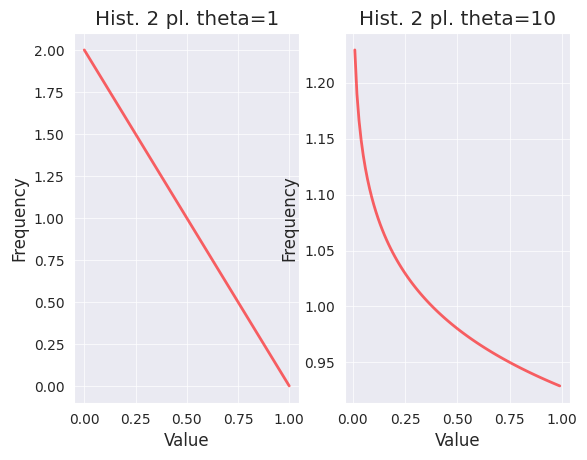

In [ ]:
fig, ax = plt.subplots(1, 2)
x = np.linspace(0.0, 1.0, num=100)
pr1 = lambdify(z, prMax2.subs(theta, 1), "numpy")
pr10 = lambdify(z, prMax2.subs(theta, 10), "numpy")
ax[0].plot(x, pr1(x),'r-', lw=2, alpha=0.6, label='Pr Theta=1')
ax[0].set(title='Hist. 2 pl. theta=1', xlabel='Value', ylabel='Frequency')
ax[1].plot(x, pr10(x),'r-', lw=2, alpha=0.6, label='Pr Theta=1')
ax[1].set(title='Hist. 2 pl. theta=10', xlabel='Value', ylabel='Frequency')
plt.show()

In [ ]:
# a panel to explore Beta distribution.
import panel as pn
import holoviews as hv

pn.extension(design='material')
theta_widget = pn.widgets.EditableFloatSlider(name='Theta', start=1, end=10, step=0.2, value=1)
@pn.depends(t=theta_widget)
def plot_gumbel_aggregate2(t):
    xs = np.linspace(0,1)
    pr = lambdify(z, prMax2.subs(theta, t), "numpy")
    points = [(i, pr(i)) for i in xs]
    return hv.Curve(points).opts(width=600, framewise=True)

@pn.depends(t=theta_widget)
def plot_gumbel_aggregate3(t):
    xs = np.linspace(0,1)
    pr = lambdify(z, prMax3.subs(theta, t), "numpy")
    points = [(i, pr(i)) for i in xs]
    return hv.Curve(points).opts(width=600, framewise=True)


bound_gumble2_plot = pn.bind(plot_gumbel_aggregate2, t=theta_widget)
bound_gumble3_plot = pn.bind(plot_gumbel_aggregate3, t=theta_widget)
gumble_app =  pn.Column(pn.WidgetBox('## Gumble Explorer', theta_widget), bound_gumble2_plot, bound_gumble3_plot).servable()

gumble_app

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] EditableFloatSlider(end=10, name='Theta', start=1, step=0.2, value=1, width=300)
    [1] ParamFunction(function, _pane=HoloViews)
    [2] ParamFunction(function, _pane=HoloViews)

### Simulation

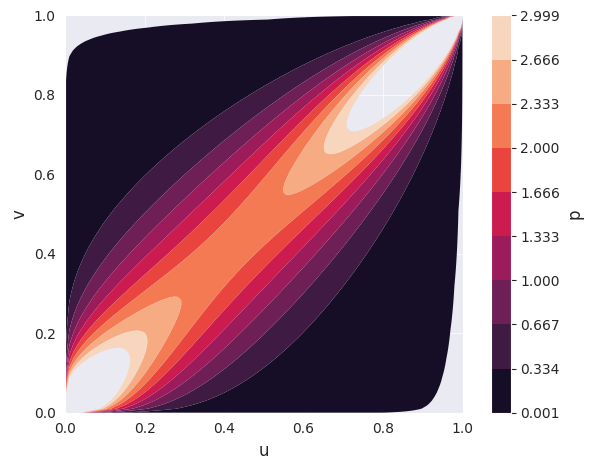

In [ ]:
from statsmodels.distributions.copula.api import (CopulaDistribution, GumbelCopula, IndependenceCopula)

default_rng = np.random.default_rng()
copula2 = GumbelCopula(theta=3.1)
_ = copula2.plot_pdf()  # returns a matplotlib figure

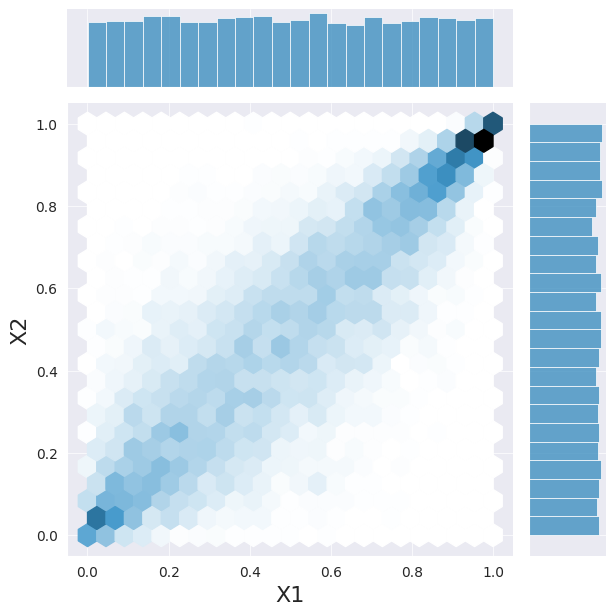

In [ ]:
import numpy as np

sample = copula2.rvs(10000, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("X1", "X2", fontsize=16)

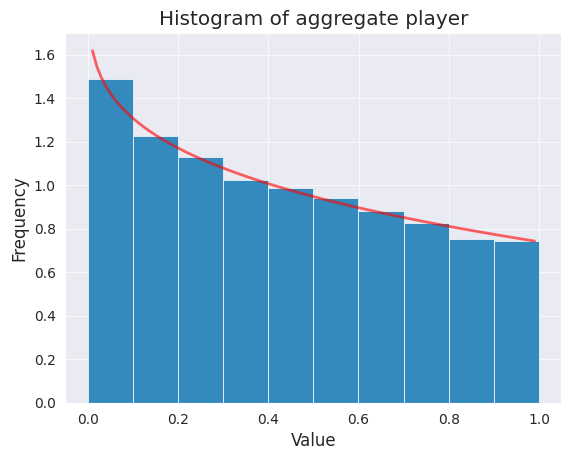

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

players = 2
samples = 10000
t=3.0001

copula3 = GumbelCopula(theta=t, k_dim=players)
vals = copula3.rvs(samples, random_state=default_rng)

# Creating figure
fig, ax = plt.subplots(1, 1)
ax.hist(vals.min(1), density=True)
ax.set(title='Histogram of aggregate player', xlabel='Value', ylabel='Frequency')

x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(z, prMax2.subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
#ax.plot(x, beta.pdf(x, 1, players),'g-', lw=2, alpha=0.6, label='beta pdf')
plt.show()

The current version of the previous library (statsmodels.distributions.copula) has limitations to generate random values in dimensions greater than 2. I try another library called pycop that allows to overcome this limitation.

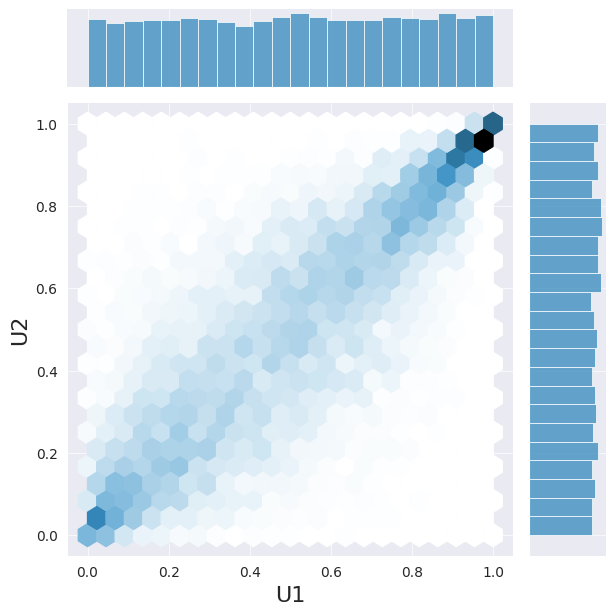

In [ ]:
!pip install pycop --quiet
from scipy.stats import norm
from pycop import simulation

players = 2
samples = 10000
t=3.0001
u1, u2 = simulation.simu_archimedean("gumbel", players, samples, theta=t)

h = sns.jointplot(x=u1, y=u2, kind="hex")
_ = h.set_axis_labels("U1", "U2", fontsize=16)

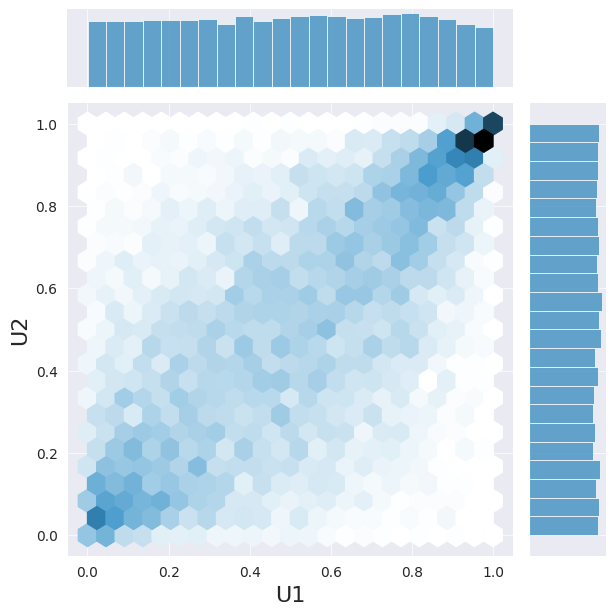

In [ ]:
players = 4
samples = 10000
t=2.0001
u = simulation.simu_archimedean("gumbel", players, samples, theta=t)

h = sns.jointplot(x=u[0], y=u[1], kind="hex")
_ = h.set_axis_labels("U1", "U2", fontsize=16)

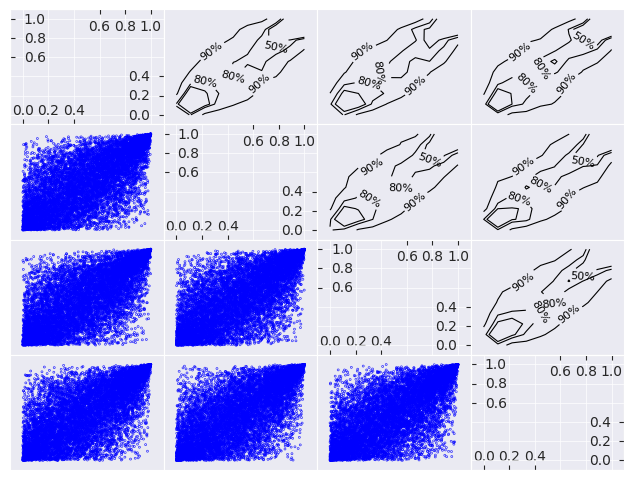

In [ ]:
from pycop import utils
utils.empiricalplot(u, contour=True)

### Copula of the aggregated Player

A copula C is called Archimedean if it admits the representation:
$${\displaystyle C(u_{1},\dots ,u_{d};\theta )=\psi \left(\psi^{-1} (u_{1};\theta )+\dots +\psi^{-1} (u_{d};\theta );\theta \right)}$$

The idea is to reduce this formulation to two players where one of the is the aggregate player reporting the mininum value of her cluster:

$$C(u_1, y) = \psi_m(\psi_m^{-1}(u_1;\theta_m ) + \psi_m^{-1}(y;\theta_m)) \tag{3}$$
where $y=\min(u_2,\cdots,u_d)$.

My goal is to try to prove through simulations that it is enough to use the $F_m$ of the aggregate player and that it is not necessary to change the copula (it will remain a Gumble copula) nor the parameter $theta$ that defines it.

To do this I will proceed as follows:

1. Simulate several correlated players.
  1. Check that the minimum of the $d-1$ players corresponds to the function $Fd-1m$.
  2. After that, check that the minimum of a player against the aggregate also corresponds to the function $Fdm$
3. Simulate two clusters of 2 players each. It must remain the same function $Fm$.






In [ ]:
from sympy import *
from sympy.abc import k, n

# define variables
y = symbols('y', nonnegative=True)
theta = Symbol("theta", positive=True)

Fm=n*y + Sum((-1)**(k-1)*binomial(n, k)*exp(-pow((k)*pow(-ln(y), theta), 1/theta)), (k, 2, n))

In [ ]:
F2min=simplify(Fm.subs(n,2).doit())
F2min

2*y - exp(-(2*(-log(y))**theta)**(1/theta))

In [ ]:
F3min=simplify(Fm.subs(n,3).doit())
F3min

3*y + exp(-(3*(-log(y))**theta)**(1/theta)) - 3*exp(-(2*(-log(y))**theta)**(1/theta))

In [ ]:
F4min=simplify(Fm.subs(n,4).doit())
F4min

4*y - exp(-(4*(-log(y))**theta)**(1/theta)) + 4*exp(-(3*(-log(y))**theta)**(1/theta)) - 6*exp(-(2*(-log(y))**theta)**(1/theta))

In [ ]:
F5min=simplify(Fm.subs(n,5).doit())
F5min

5*y + exp(-(5*(-log(y))**theta)**(1/theta)) - 5*exp(-(4*(-log(y))**theta)**(1/theta)) + 10*exp(-(3*(-log(y))**theta)**(1/theta)) - 10*exp(-(2*(-log(y))**theta)**(1/theta))

In [ ]:
# 1.1 Simulate five correlated players.
players = 5
samples = 10000
t=2.0001
u = simulation.simu_archimedean("gumbel", players, samples, theta=t)

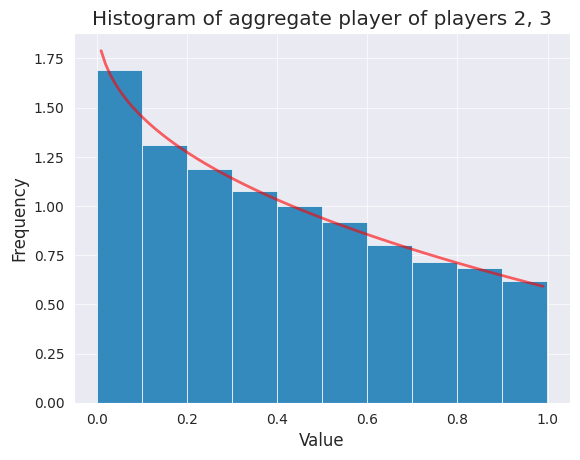

In [ ]:
# 1.1 Check that the minimum of the two players corresponds to the function F2min
u_aggr = np.minimum(u[1], u[2])

fig, ax = plt.subplots(1, 1)
ax.hist(u_aggr, density=True)
ax.set(title='Histogram of aggregate player of players 2, 3', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F2min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

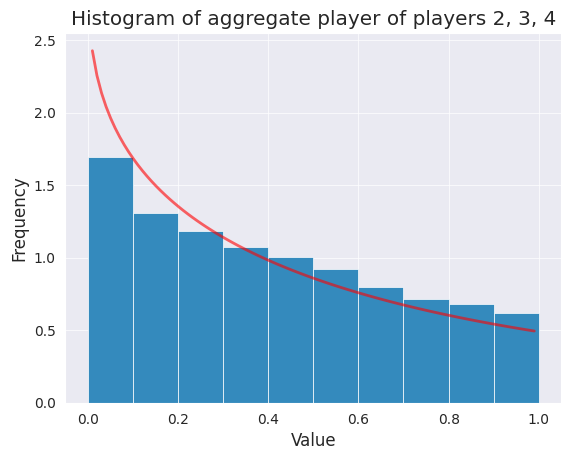

In [ ]:
# 1.1 Check that the minimum of the three players corresponds to the function F3min
u_aggr = np.minimum(u[1], u[2], u[3])

fig, ax = plt.subplots(1, 1)
ax.hist(u_aggr, density=True)
ax.set(title='Histogram of aggregate player of players 2, 3, 4', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F3min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

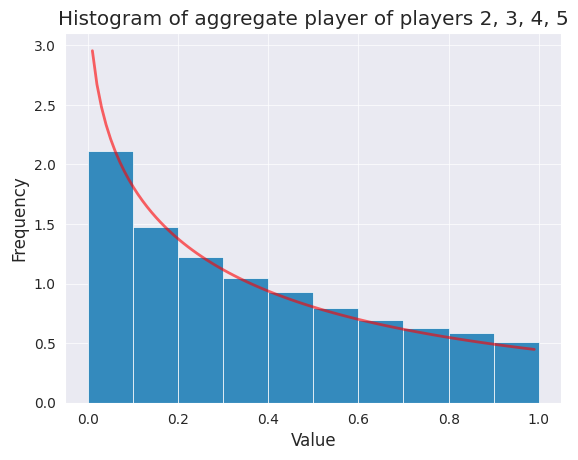

In [ ]:
# 1.1 Check that the minimum of the four players corresponds to the function F4min
u_aggr = np.minimum(np.minimum(u[1], u[2]),np.minimum( u[3], u[4]))

fig, ax = plt.subplots(1, 1)
ax.hist(u_aggr, density=True)
ax.set(title='Histogram of aggregate player of players 2, 3, 4, 5', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F4min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

In [ ]:
from scipy.stats import rv_continuous
class AggreagatePlayer(rv_continuous):
    """
    Define the RV associate to an aggregate player
    """
    "Aggregate Player"
    dist_name = "Aggregate_Player"
    def __init__(self,cdfepr, theta_param, sym):
      super().__init__(a=0, b=1)
      self.theta = theta_param
      self.symbol = sym
      cdfsymb = cdfepr.subs(theta, theta_param)
      self.cdf_expr = lambdify(sym, cdfsymb, "numpy")
      self.pdf_expr = lambdify(sym, diff(cdfsymb, sym), "numpy")
    def _pdf(self, x):
        return self.pdf_expr(x)

    def _cdf(self, x):
        return self.cdf_expr(x)

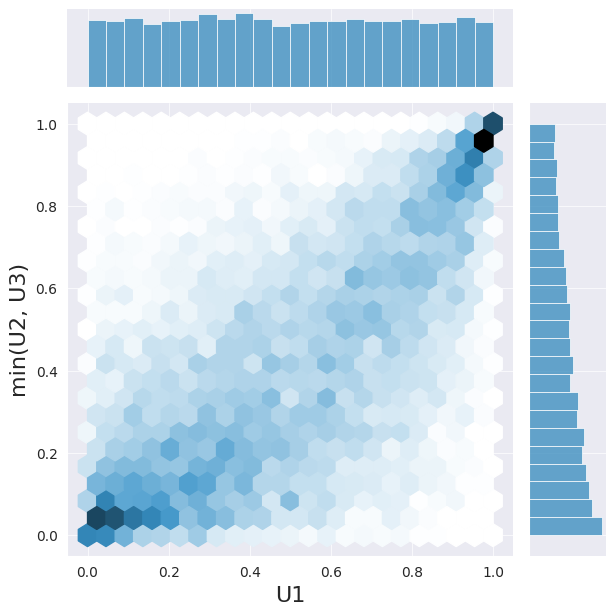

In [ ]:
#1.1 check that the minimum of a player against the aggregate also corresponds to the function  F2m
# one player against the aggregate of two
pdfY = AggreagatePlayer(cdfepr=F2min, theta_param=t, sym=y)
marginals = [stats.uniform(), pdfY]
joint_dist = CopulaDistribution(copula=GumbelCopula(theta=t), marginals=marginals)
sample = joint_dist.rvs(samples, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("U1", "min(U2, U3)", fontsize=16)

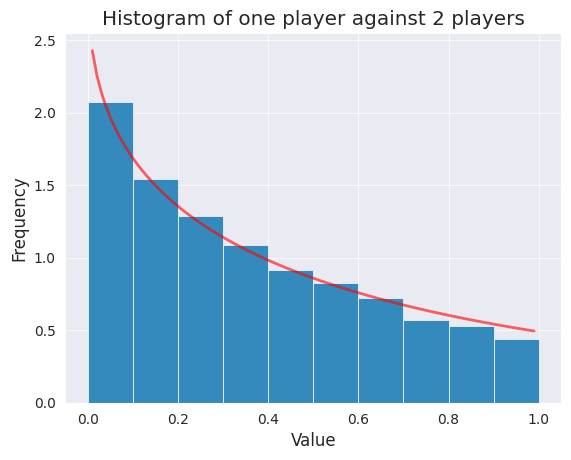

In [ ]:
# 1.2  one player against the aggregate of two
u_min = np.minimum(sample[:, 0], sample[:, 1])

fig, ax = plt.subplots(1, 1)
ax.hist(u_min, density=True)
ax.set(title='Histogram of one player against 2 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F3min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

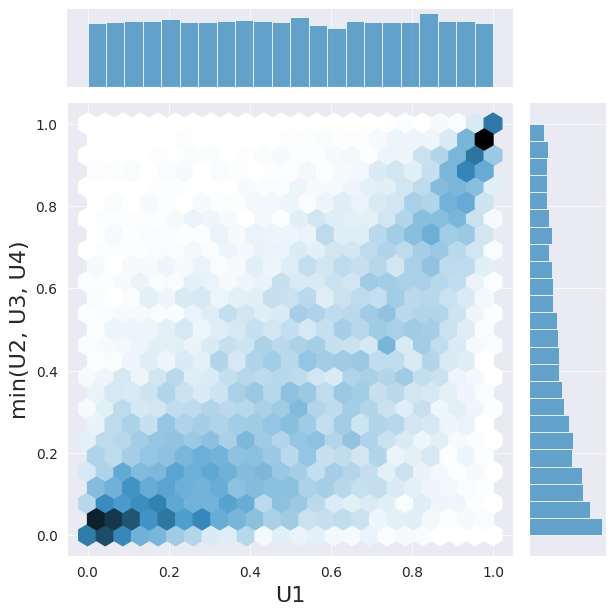

In [ ]:
#1.1 check that the minimum of a player against the aggregate also corresponds to the function  F2m
# one player against the aggregate of three
pdfY = AggreagatePlayer(cdfepr=F3min, theta_param=t, sym=y)
marginals = [stats.uniform(), pdfY]
joint_dist = CopulaDistribution(copula=GumbelCopula(theta=t), marginals=marginals)
sample = joint_dist.rvs(samples, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("U1", "min(U2, U3, U4)", fontsize=16)

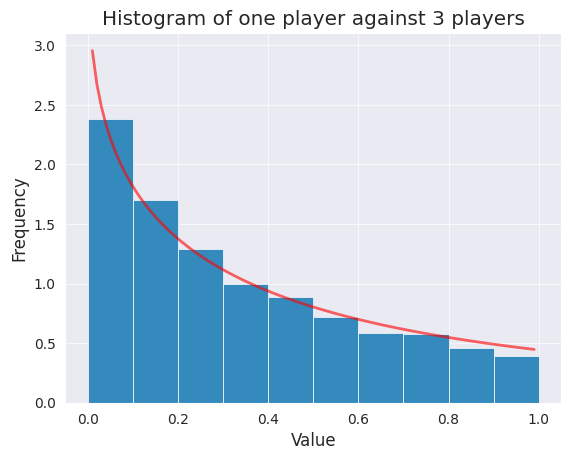

In [ ]:
# 1.2  one player against the aggregate of three
u_min = np.minimum(sample[:, 0], sample[:, 1])

fig, ax = plt.subplots(1, 1)
ax.hist(u_min, density=True)
ax.set(title='Histogram of one player against 3 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F4min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

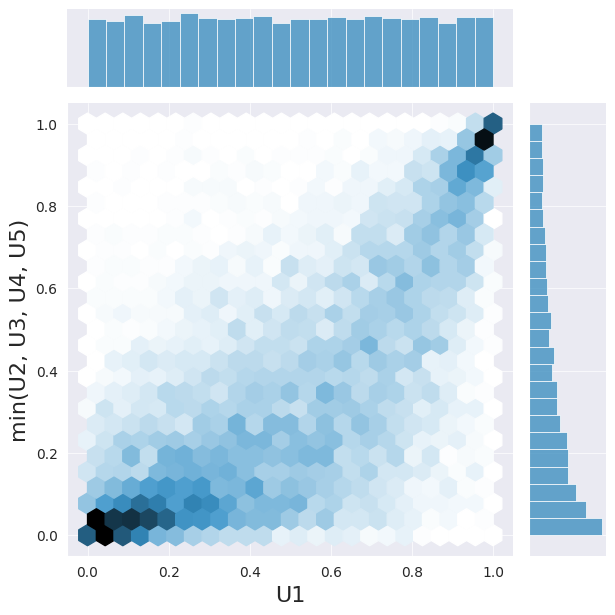

In [ ]:
#1.1 check that the minimum of a player against the aggregate also corresponds to the function  F2m
# one player against the aggregate of four
pdfY = AggreagatePlayer(cdfepr=F4min, theta_param=t, sym=y)
marginals = [stats.uniform(), pdfY]
joint_dist = CopulaDistribution(copula=GumbelCopula(theta=t), marginals=marginals)
sample = joint_dist.rvs(samples, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("U1", "min(U2, U3, U4, U5)", fontsize=16)

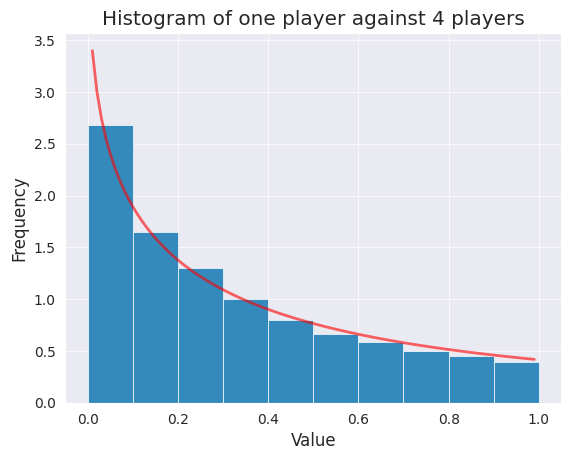

In [ ]:
# 1.2  one player against the aggregate of four
u_min = np.minimum(sample[:, 0], sample[:, 1])

fig, ax = plt.subplots(1, 1)
ax.hist(u_min, density=True)
ax.set(title='Histogram of one player against 4 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F5min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

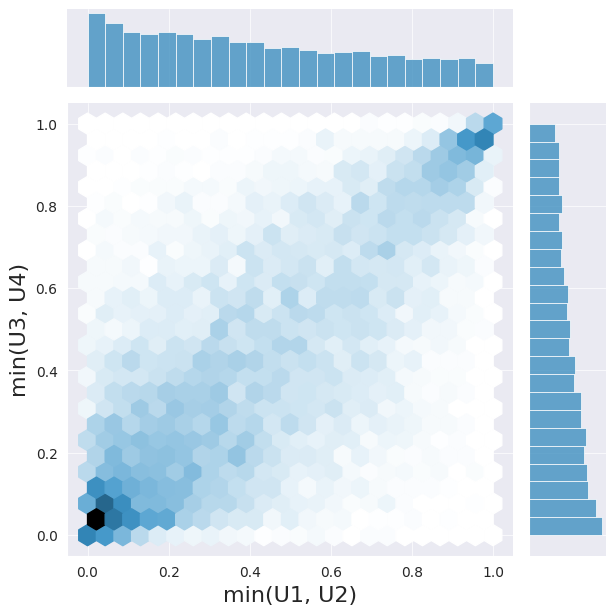

In [ ]:
#2.1 Simulate two clusters of 2 players each. It must remain the same function $Fm$.
pdfY = AggreagatePlayer(cdfepr=F2min, theta_param=t, sym=y)
marginals = [pdfY, pdfY]
joint_dist = CopulaDistribution(copula=GumbelCopula(theta=t), marginals=marginals)
sample = joint_dist.rvs(samples, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("min(U1, U2)", "min(U3, U4)", fontsize=16)

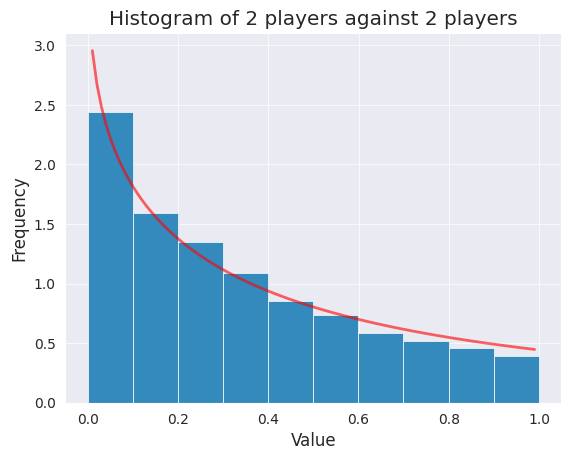

In [ ]:
# 2.1  2 players against 2 players
u_min = np.minimum(sample[:, 0], sample[:, 1])

fig, ax = plt.subplots(1, 1)
ax.hist(u_min, density=True)
ax.set(title='Histogram of 2 players against 2 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F4min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

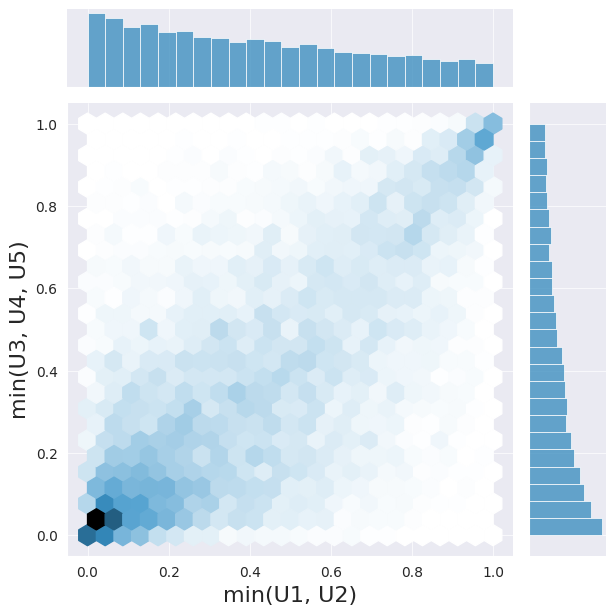

In [ ]:
#3.1 Simulate two clusters of 2 and 3 players each. It must remain the same function $Fm$.
pdf2Y = AggreagatePlayer(cdfepr=F2min, theta_param=t, sym=y)
pdf3Y = AggreagatePlayer(cdfepr=F3min, theta_param=t, sym=y)
marginals = [pdf2Y, pdf3Y]
joint_dist = CopulaDistribution(copula=GumbelCopula(theta=t), marginals=marginals)
sample = joint_dist.rvs(samples, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("min(U1, U2)", "min(U3, U4, U5)", fontsize=16)

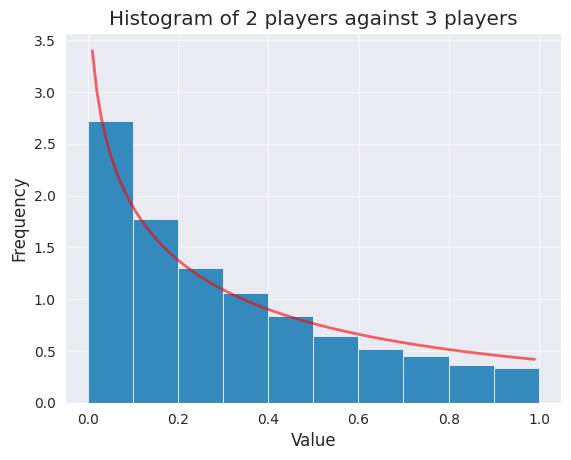

In [ ]:
# 3.1  2 players against 3 players
u_min = np.minimum(sample[:, 0], sample[:, 1])

fig, ax = plt.subplots(1, 1)
ax.hist(u_min, density=True)
ax.set(title='Histogram of 2 players against 3 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F5min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

### Simulación para confirmar la copula

Primero simulo tres jugadores con copula de Gumbel con un theta determinado y sin transformada. Con esa simulación se calcula:
* Número de veces que gana un jugador a QPQ
* Utilidad que obtiene el jugador en QPQ

In [ ]:
!pip install pycop --quiet
from scipy.stats import norm
from pycop import simulation

#### Simulación de casos concretos de Archimedean

In [ ]:
players = 3
samples = 10000
t= 5.0001
#copula= "gumbel"
#copula= "clayton"
copula= "frank"
#copula= "amh" --not working--
u = simulation.simu_archimedean(copula, players, samples, theta=t)

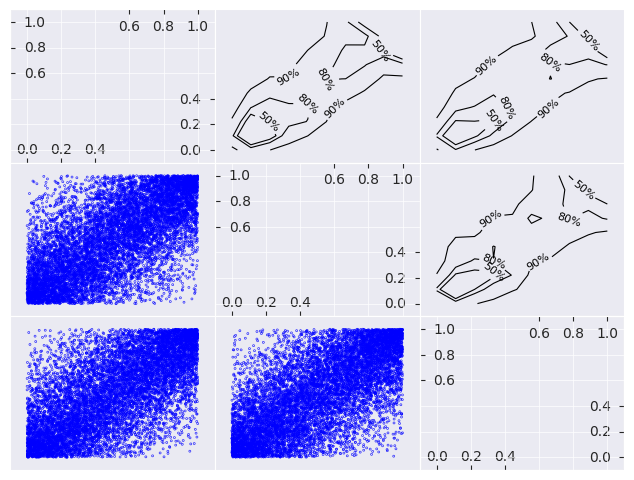

In [ ]:
from pycop import utils
utils.empiricalplot(u, contour=True)

<Axes: ylabel='Count'>

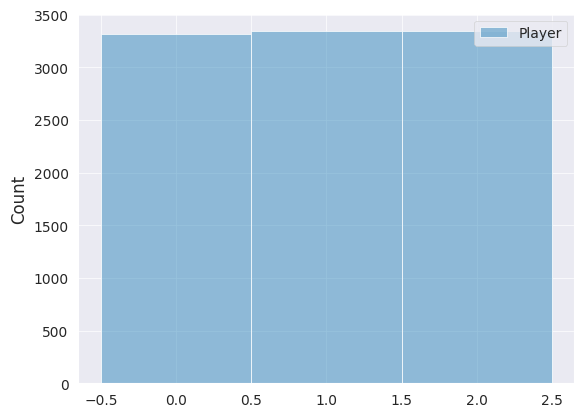

In [ ]:
u_argmin = np.argmin(u, axis=0)
df = pd.DataFrame(u_argmin, columns = ['Player'])
sns.histplot(data=df, discrete=True)

In [ ]:
utility = np.zeros(players)
for k in range(samples):
  utility[u_argmin[k]] += u[u_argmin[k]][k]
utility

array([1186.78289405, 1191.93985894, 1236.72583346])

In [ ]:
from sympy import *
from sympy.abc import k, n

# define variables
y = symbols('y', nonnegative=True)
theta = Symbol("theta", positive=True)

FmGumbel = n*y + Sum((-1)**(k-1)*binomial(n, k)*exp(-pow((k)*pow(-ln(y), theta), 1/theta)), (k, 2, n))
FmClyton = n*y + Sum((-1)**(k-1)*binomial(n, k)*pow(2*pow(y,-theta)-1, -1/theta), (k, 2, n))
FmFrank = n*y + Sum((-1)**(k-1)*binomial(n, k)*-1/theta*ln (1+ pow((exp(-theta*y)-1), k)/(exp(-theta) -1)), (k, 2, n))
FmAMH = n*y + Sum((-1)**(k-1)*binomial(n, k)*pow(y,k)/(1-theta*pow(1-y, k)), (k, 2, n))
Fm = FmFrank
F2min=simplify(Fm.subs(n,2).doit())
F2min

log(-(-exp(theta) - exp(2*theta*y) + 2*exp(theta*y + theta))/(1 - exp(theta)))/theta

In [ ]:
from scipy.stats import rv_continuous
class AggreagatePlayer(rv_continuous):
    """
    Define the RV associate to an aggregate player
    """
    "Aggregate Player"
    dist_name = "Aggregate_Player"
    def __init__(self,cdfepr, theta_param, sym):
      super().__init__(a=0, b=1)
      self.theta = theta_param
      self.symbol = sym
      cdfsymb = cdfepr.subs(theta, theta_param)
      self.cdf_expr = lambdify(sym, cdfsymb, "numpy")
      self.pdf_expr = lambdify(sym, diff(cdfsymb, sym), "numpy")
    def _pdf(self, x):
        return self.pdf_expr(x)

    def _cdf(self, x):
        return self.cdf_expr(x)

In [ ]:
class TransfAMH(object):
    '''
    requires -1 =< theta <=1
    '''

    def _checkargs(theta):
        return (-1 <= theta) and (theta <= 1)

    def evaluate(self, t, theta):
        return np.ln((1 - theta*(1-t))/t)


    def inverse(self, phi, theta):
        return (1-theta)/(np.exp(phi) - theta)

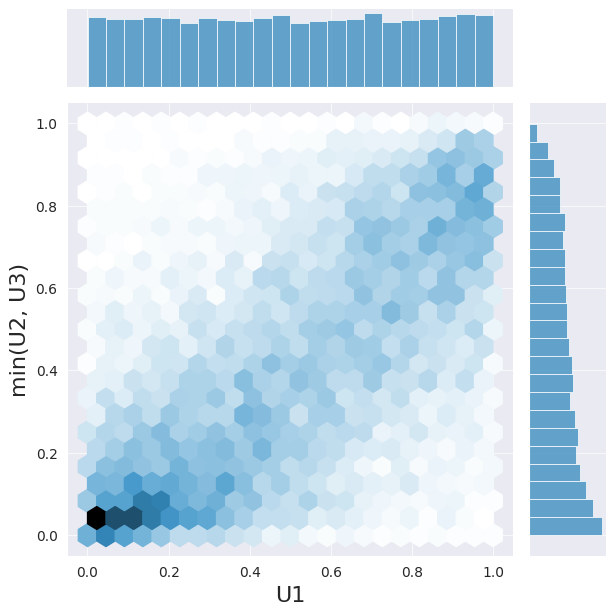

In [ ]:
pdfY = AggreagatePlayer(cdfepr=F2min, theta_param=t, sym=y)
marginals = [stats.uniform(), pdfY]
#joint_dist = CopulaDistribution(copula=GumbelCopula(theta=t), marginals=marginals)
#joint_dist = CopulaDistribution(copula=ClaytonCopula(theta=t), marginals=marginals)
#joint_dist = CopulaDistribution(copula=ArchimedeanCopula(TransfAMH, (theta, t)), marginals=marginals)
joint_dist = CopulaDistribution(copula=FrankCopula(theta=t), marginals=marginals)
sample = joint_dist.rvs(samples, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("U1", "min(U2, U3)", fontsize=16)

In [ ]:
u_argmin = np.argmin(sample, axis=1)
df = pd.DataFrame(u_argmin, columns = ['Player'])
sns.histplot(data=df, discrete=True)

NameError: ignored

In [ ]:
utility = np.zeros(2)
for k in range(samples):
  utility[u_argmin[k]] += sample[k][u_argmin[k]]
utility

array([1199.28689135, 2378.07253803])

#### Simulación de otras copulas


In [6]:
players = 3 # dimension
samples = 10000 # sample size

In [7]:
from scipy.stats import random_correlation
rng = np.random.default_rng()
seed = 1234567890
rho1 = 0.5
rho2 = 0.2
corrMatrix = random_correlation.rvs((rho1, rho2, players - (rho1 + rho2)), random_state=seed)
#corrMatrix = np.array([[1, rho1, rho1], [rho1, 1, rho1],  [rho1, rho1, 1]])
corrMatrix

array([[ 1.        ,  0.69607446, -0.74386763],
       [ 0.69607446,  1.        , -0.50213673],
       [-0.74386763, -0.50213673,  1.        ]])

El primer paso es generar los valores de los jugadores. Se almacenan en la variable u. Esta variable es una matrix de dimensión jugadores x rondas

In [ ]:
u = simulation.simu_gaussian(players, samples, corrMatrix)

Hacemos un gráfico para ver las posibles relaciones entre jugadores. En la diagonal izquierda se ven los scatter plots entre cada par de jugadores

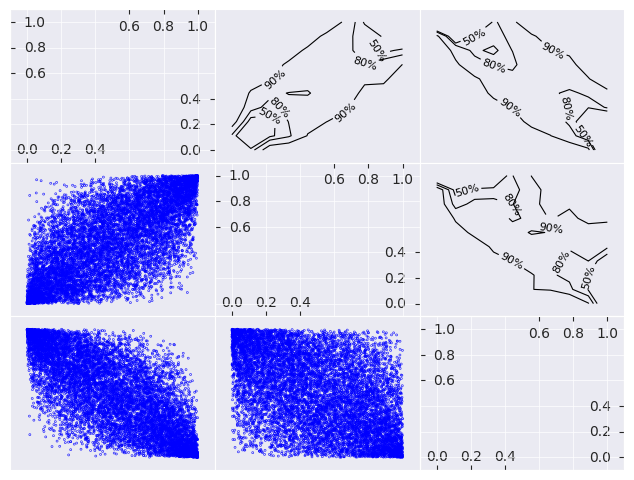

In [ ]:

utils.empiricalplot(u, contour=True)

Aplicamos QPQ para ver qué jugador se llevaría la asignación de cada ronda. Eso se guarda en la variable u_argmin.

Dibujamos el número de veces que cada jugador ha ganado (perdido).

NOTA: observad que he aplicado argmin directamente a la matrix de valores, sin aplicar ninguna transformación. Por lo tanto es como aplicar QPQ sin tener transformaciones lineales (la línea de corte es la digaonal)

<Axes: ylabel='Count'>

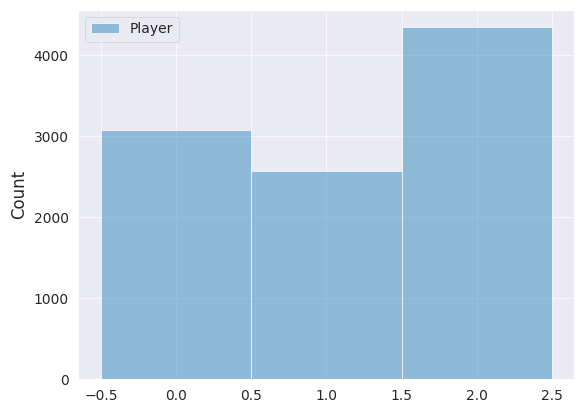

In [ ]:
u_argmin = np.argmin(u, axis=0)
df = pd.DataFrame(u_argmin, columns = ['Player'])
sns.histplot(data=df, discrete=True)

Y ahora calculo el esfuerzo que le ha costado a cada jugador (por eso el 1 - utililidad). También calculo el vector de utilidades que le ha supuesto al conjunto de todos los jugadores.

In [ ]:
utility = np.zeros(players)
min_utility = np.zeros(samples)
for k in range(samples):
  utility[u_argmin[k]] += (1 - u[u_argmin[k]][k])
  min_utility[k] = u[u_argmin[k]][k]
utility

array([2327.06919474, 2039.84266107, 3272.4966415 ])

Lo imprimo solo para ver qué pinta tine. Me puedo ahorrar esta línea.

In [ ]:
df = pd.DataFrame(min_utility, columns = ['Min'])
df

,Min
0,0.194380
1,0.134169
2,0.267117
3,0.430753
4,0.315766
...,...
9995,0.158090
9996,0.161743
9997,0.325786
9998,0.233581


Lo interesante es ver como sería el histograma del mínimo de tres jugadores

<Axes: ylabel='Count'>

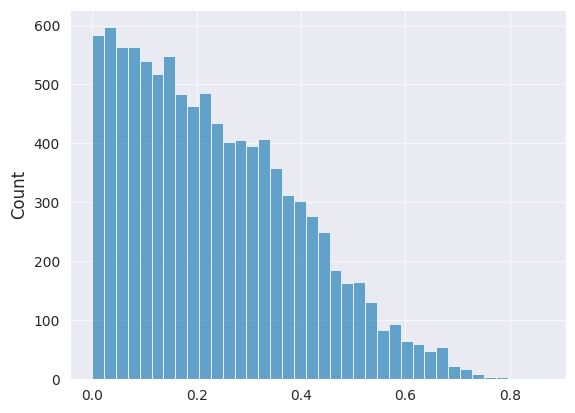

In [ ]:
sns.histplot(data=min_utility)

In [ ]:
# just testing notation
# Checking that I am working with players 2 and 3
u[1:3,:]

array([[0.4315522 , 0.40498656, 0.89351609, ..., 0.59392364, 0.58401651,
        0.04056556],
       [0.19437983, 0.94664391, 0.26711733, ..., 0.32578625, 0.43811971,
        0.8459955 ]])

Ahora repito un proceso similar al anterior pero solo con los jugadores 2 y 3.
Con la información que obtenga, crearé el jugador agregado
El primer paso es calcular las rondas que gana cada uno de los dos jugadores
El resultado lo guardo en una variable distinta (u_argmin2players) por si necesito hacer comprobaciones

array([1, 0, 1, ..., 1, 1, 0])

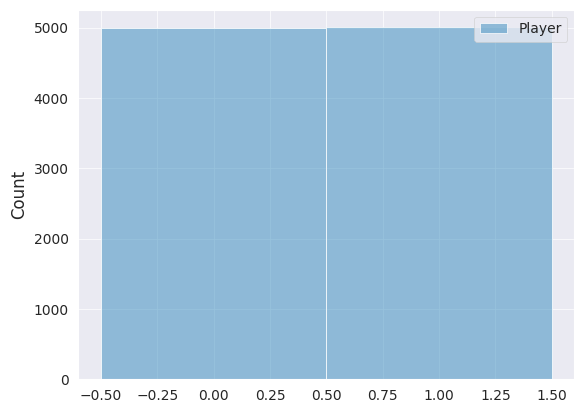

In [ ]:
u_argmin2players = np.argmin(u[1:3,:], axis=0)
df = pd.DataFrame(u_argmin2players, columns = ['Player'])
sns.histplot(data=df, discrete=True)
u_argmin2players

Y ahora calculo el mínimo de la utilidad (el menor valor declarado por los dos jugadores). No he calculado el coste real (el 1 menos la utilidad) por no considerarlo relevante a la hora de construir el jugador agregado.

In [ ]:
min_utility2players = np.zeros(samples)
for k in range(samples):
  min_utility2players[k] = u[u_argmin2players[k]+1][k]
min_utility2players

array([0.19437983, 0.40498656, 0.26711733, ..., 0.32578625, 0.43811971,
       0.04056556])

Observar que la gráfica es ligeramente menos "empinada" que la correspondiente a tres jugadores, aunque la forma es similar. Parece que tiene sentido.

La variable min_utility2players tiene la marginal empírica del jugador agregado. En el caso de la copula gausiana la formula matematica de esta marginal era compleja por lo que he obteado por la empírica. Quizás más adelante pueda calcular la función real y aplicarla. Para un futuro.

<Axes: ylabel='Count'>

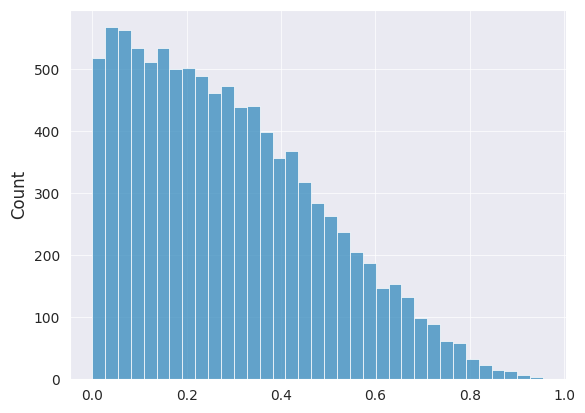

In [ ]:
sns.histplot(data=min_utility2players)

Ahora dibujo la joint distribution REAL que existe entre el jugador 1 y el jugador agregado. Es la distribución real ya que estoy comparando el valor que ha dicho el jugador 1 con el menor valor de los jugadores 2 y 3. Y usando los mismos datos y el mismo orden que resultó de la simulación ( utilizo la variable u obtenida en elprimer paso del proceso, ver más arriba)

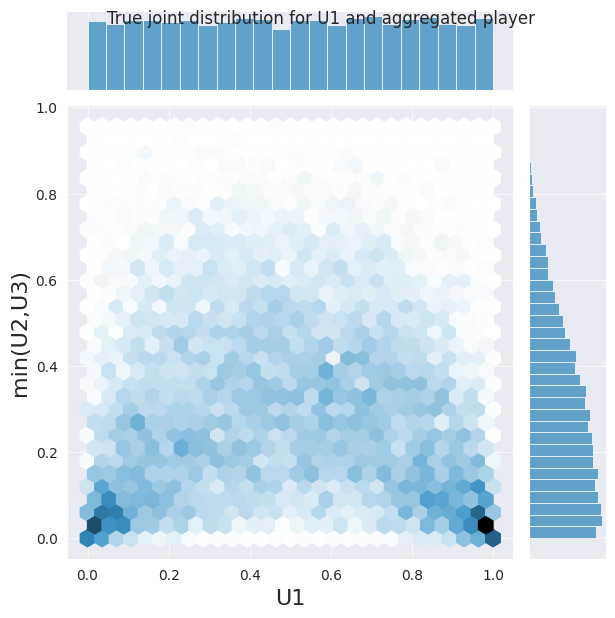

In [ ]:
# Plotting true copula between Player 1 and Aggregated Player
h = sns.jointplot(x=u[0], y=min_utility2players, kind="hex")
_ = h.set_axis_labels("U1", "min(U2,U3)", fontsize=16)
_ = h.fig.suptitle('True joint distribution for U1 and aggregated player')

Miro los coeficientes de correlación que hay entre los jugadores 1 y el agregado.
Los valores obtenidos me servirán para intentar generar una copula gausiana entre ellos. La idea es comparar la joint distribución real con la simulada según esa copula.

Importante la llamada a la función numpy.corrcoef que retorna una matriz con los coeficientes de correlación. Segun el manual se define como: "Return Pearson product-moment correlation coefficients."

In [ ]:
from scipy.stats import pearsonr, spearmanr
# calculate Pearson's correlation
corr, _ = pearsonr(u[0], min_utility2players)
print('Pearsons correlation: %.3f' % corr)

# calculate spearman's correlation
corr, _ = spearmanr(u[0], min_utility2players)
print('Spearmans correlation: %.3f' % corr)

# calculate correlation coefficient
corrcoef = np.corrcoef(u[0], min_utility2players)
print('Correlation coefficient: %.3f' % corrcoef[0,1])

Pearsons correlation: -0.034
Spearmans correlation: -0.031
Correlation coefficient: -0.034


La simulación de una copula gausiana a partir de una margina concreta me ha costado más que con las copulas de arquímedes. Las librerías que existen no me han permitido una simulación sencilla. He localizado hasta tres posibles librerías que simulan Copulas. Pero ninguna me ofrece todo lo que buscaba y por eso las he ido mezclando a lo largo de todo el notebook. Quizás en el futuro las librerías se vuelvan maduras y estables.
Por el momento simulo una gausiana usando la propua definición de copula gausiana, con la distribución multivariada normal y transformando las marginales.

Para la construcción de la copula, observar que utilizo la matriz de correlación (la variable corrcoef) antes obtenida de forma empírica. Esa matriz se utiliza en la construcción de la distribución stats.multivariate_normal

Observad que en un primer momento la variable Y tiene una marginal uniforme. Mas adelante la cambio por la marginal del jugador agregado.

In [ ]:
mu_c = np.array([0,0])
# define multivariate normal distribution
#corrcoef = [[1, rho1], [rho1, 1]]
dist_c = stats.multivariate_normal(mean=mu_c, cov=corrcoef)
# sample from the distribution
sample_c = dist_c.rvs(size=samples)
# transform marginals to uniform
X = sample_c[:,0]
Y = sample_c[:,1]
u_x = stats.norm.cdf(X)
u_y = stats.norm.cdf(Y)
# define required marginal distributions
dist_x = stats.uniform()
dist_y = stats.uniform()

Dibujo la gausiana obtenida antes de substituir la marginal del jugador agregado para comprobar que tiene buena pinta.  

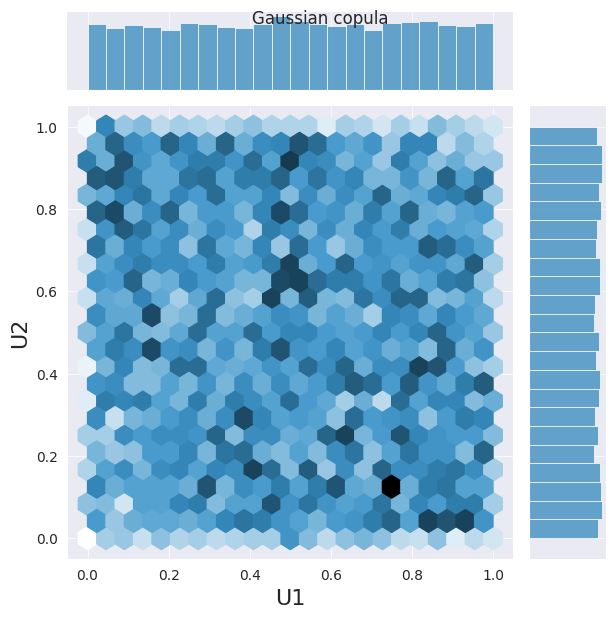

In [ ]:
# testing a regular copula with uniforms marginals
h = sns.jointplot(x=dist_x.ppf(u_x), y=dist_y.ppf(u_y), kind="hex")
_ = h.set_axis_labels("U1", "U2", fontsize=16)
_ = h.fig.suptitle('Gaussian copula')

Este paso es complicado ya que implica definir una clase python para simular una distribución empírica que pueda utilizar para hacer las transformadas necesarias. Salvo que no haya sabido buscar correctamente, es una de las limitaciones que me he encontrado con las librerías actuales.

In [ ]:
class DistECDF(ECDF):
  def __init__(self, x, side='right'):
    super(DistECDF, self).__init__(x, side=side)
    self.vfunc = np.vectorize(self._ppf)

  def _ppf(self, p):
    val = self.x[int(self.n * p)]
    if (val < 0):
      return 0
    elif (val > 1):
      return 1
    else:
      return val

  def ppf(self, v):
    return self.vfunc(v)

Construyo la distribución empírica y comprueba que funciona el PPF.

In [ ]:
# redefine the aggregated player marginal distributions
dist_y = DistECDF(min_utility2players)
print(dist_y.ppf(np.array([0.2561, 0.999999])))
dist_y.ppf(u_y)

[0.12892316 0.95524903]


array([0.05599924, 0.14561116, 0.44644373, ..., 0.16069372, 0.40466017,
       0.53411949])

Ahora dibujo las dos copulas que he construido. A la izquierda está la copula sin transformar la marginal del jugador agregado. A la derecha la copula poniendo la marginal correcta del jugador agregado.

Recordad que la marginal del jugador agregado se ha calculado de forma empírica ya que la fórmula para la copula gausiana es compleja.

[Text(0.5, 1.0, 'Copula U1 and Aggr. Player'),
 Text(0.5, 0, 'X'),
 Text(0, 0.5, 'Y')]

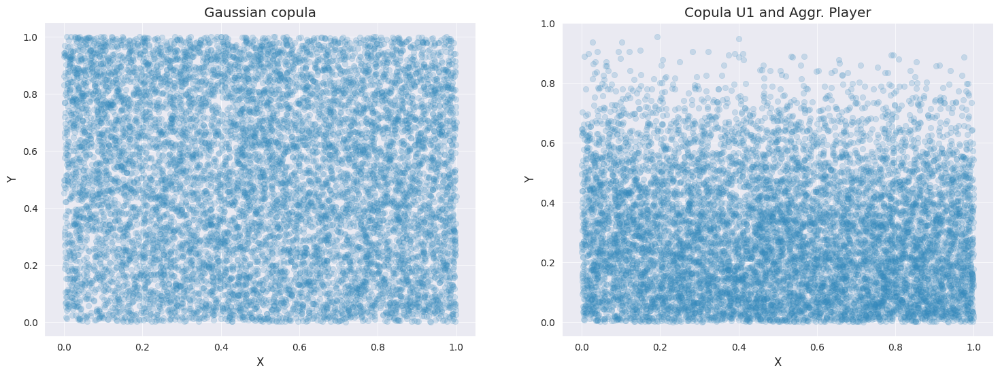

In [ ]:
fig, ax = plt.subplots(figsize=(18,6), nrows=1, ncols=2)
ax[0].scatter(u_x, u_y, alpha=0.2)
ax[0].set(title=r'Gaussian copula', xlabel='X', ylabel='Y')
ax[1].scatter(dist_x.ppf(u_x), dist_y.ppf(u_y), alpha=0.2)
ax[1].set(title='Copula U1 and Aggr. Player', xlabel='X', ylabel='Y')

Vuelvo a dibujar la joint distribution simulada pero esta vez las marginales para comprobación

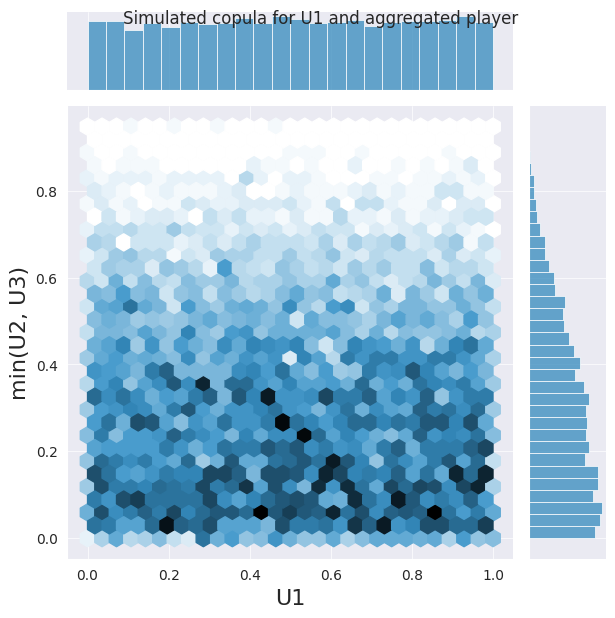

In [ ]:
# another plot just to confirm.
h = sns.jointplot(x=dist_x.ppf(u_x), y=dist_y.ppf(u_y), kind="hex")
_ = h.set_axis_labels("U1", "min(U2, U3)", fontsize=16)
_ = h.fig.suptitle('Simulated joint distribution for U1 and aggregated player')

Este paso es quizás el más interesante. Contrasto la distribución real entre el jugador 1 vs agregado con la distribución simulada. En los casos en los que los jugadores eran indistinguibles, la simulada se parece a la real pero cuando los jugadores tienen coeficiente de correlación diferentes entre ellos, la simulada no reproduce la distribución real. Este efecto se nota sobre todo si un jugador está correlado positivamente y el otro negativamente. En la distribución real se crean dos "focos" en las esquinas inferiores. Observar las esquinas (0,0) y (1,0) del gráfico de la izquierda. Esos focos no aparecen en la gráfica de la derecha cuando los jugadores son diferentes. De hecho no es posible reproducir ese efecto solo con copula gausianas de dos variables.

[Text(0.5, 1.0, 'Simulated joint distribution'),
 Text(0.5, 0, 'X'),
 Text(0, 0.5, 'Y')]

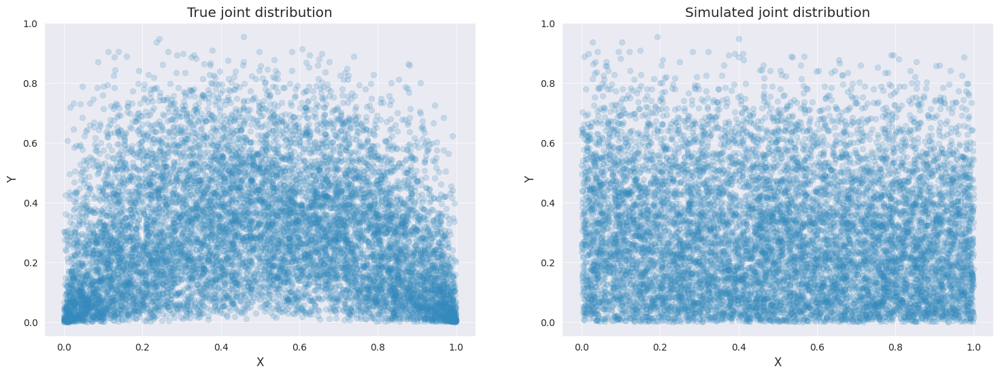

In [ ]:
# Plotting simulated versus true joint distribution between Player 1 and Aggregated Player
fig, ax = plt.subplots(figsize=(18,6), nrows=1, ncols=2)
ax[0].scatter(u[0], min_utility2players, alpha=0.2)
ax[0].set(title=r'True joint distribution', xlabel='X', ylabel='Y')
ax[1].scatter(dist_x.ppf(u_x), dist_y.ppf(u_y), alpha=0.2)
ax[1].set(title='Simulated joint distribution', xlabel='X', ylabel='Y')

Creo una variable con los valores declarados por los jugadores 1 y agregado para aplicar QPQ

In [ ]:
u2 = np.asarray([dist_x.ppf(u_x), dist_y.ppf(u_y)])
u2

array([[0.57541742, 0.81495777, 0.77389538, ..., 0.03049696, 0.19690664,
        0.56670753],
       [0.05599924, 0.14561116, 0.44644373, ..., 0.16069372, 0.40466017,
        0.53411949]])

Calculo el número de tareas entre el jugador 1 contra el agregado usando los valores simulados

<Axes: ylabel='Count'>

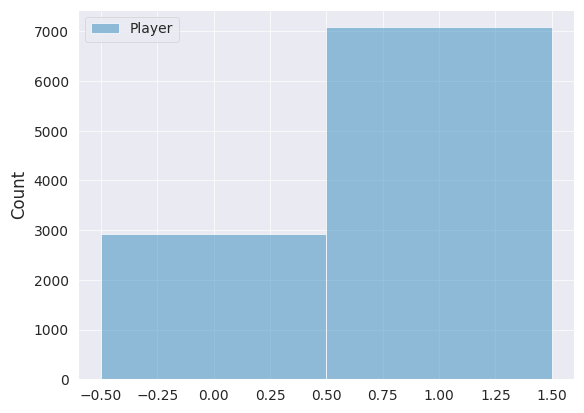

In [ ]:
# Compute the number of tasks using simulated copula
u_argmin2 = np.argmin(u2, axis=0)
df = pd.DataFrame(u_argmin2, columns = ['Player'])
sns.histplot(data=df, discrete=True)

Hago lo mismo con la utilidad = (1 - esfuerzo)

In [ ]:
utility2 = np.zeros(2)
min_utility2 = np.zeros(samples)
for k in range(samples):
  utility2[u_argmin2[k]] += (1 - u2[u_argmin2[k]][k])
  min_utility2[k] = u[u_argmin2[k]][k]
utility2

array([2294.92662807, 5451.15048998])

Y calculo las correlaciones entre el jugador 1 y el agregado obtenidos mediante simulación de la copula

In [ ]:
from scipy.stats import pearsonr, spearmanr
# calculate Pearson's correlation
corr, _ = pearsonr(u2[0], u2[1])
print('Pearsons correlation (simulated): %.3f' % corr)

# calculate spearman's correlation
corr, _ = spearmanr(u2[0], u2[1])
print('Spearmans correlation (simulated): %.3f' % corr)

# calculate correlation coefficient
corrcoef = np.corrcoef(u2[0], u2[1])
print('Correlation coefficient (simulated): %.3f' % corrcoef[0,1])

Pearsons correlation (simulated): -0.031
Spearmans correlation (simulated): -0.029
Correlation coefficient (simulated): -0.031


Para hacer más fácil las pruebas, recojo todo el código anterior en una clase

In [51]:
# Primero defino una clase para representar una distribución empírica
# Utilizo como base la clase ECDF pero tengo que complementarla con
# el métodoc ppf vectorizado
class DistECDF(ECDF):
  def __init__(self, x, side='right'):
    super(DistECDF, self).__init__(x, side=side)
    self.vfunc = np.vectorize(self._ppf)

  def _ppf(self, p):
    val = self.x[int(self.n * p)]
    if (val < 0):
      return 0
    elif (val > 1):
      return 1
    else:
      return val

  def ppf(self, v):
    return self.vfunc(v)

# Y ahora defino una clase que me servirá para hacer las simulaciones
class QPQGaussian:
  '''
  La clase tiene los siguientes métodos públicos:
  * generatevalues: regenera los valores declarados por los jugadores
  * computeQPQ: aplica la función de decisión a los 3 jugadores
  * computeQPQ_1vsaggr: aplica la función de decisión a los jugadores 1 y aggregado

  Además, tiene algunos métodos para dibujar las gráficas
  * empiricalplot_all
  *
  '''
  def __init__(self, corrMatrix, samples = 10000):
    self.players = corrMatrix.shape[0]
    self.corrMatrix = corrMatrix
    self.samples = samples

    self.generatevalues()

  # generate values for players
  def generatevalues(self):
    self.vals_all = simulation.simu_gaussian(self.players, self.samples, self.corrMatrix)
    self._generatevalues_1vsaggr()

  def _checkvals(self):
    if (not hasattr(self, 'vals_all')) or (self.vals_all is None):
      self.generatevalues()

  # calculate who the task is assigned to and the corresponding utility for all players
  def computeQPQ(self):
    self._checkvals()

    # using the diagonal as decision function, calculate who the task is assigned to
    self.argmin_all = np.argmin(self.vals_all, axis=0)
    self.df_argmin_all = pd.DataFrame(self.argmin_all, columns = ['1,2,3 Players'])

    # compute the effort and utility
    # effort_all stores the effort (1 - utility) for each player
    self.effort_all = np.zeros(self.players)
    # min_utility_all stores the minimun declared value
    self.min_utility_all = np.zeros(self.samples)
    for k in range(self.samples):
      self.effort_all[self.argmin_all[k]] += (1 - self.vals_all[self.argmin_all[k]][k])
      self.min_utility_all[k] = self.vals_all[self.argmin_all[k]][k]

  def _checkQPQ(self):
    if (not hasattr(self, 'df_argmin_all')) or (self.df_argmin_all is None):
      self.computeQPQ()

  # generate values for the aggregate player as min of players 2 and 3
  def _generatevalues_1vsaggr(self):
    self._computeQPQ_aggr()

    mu_c = np.array([0,0])
    # define multivariate normal distribution
    dist_c = stats.multivariate_normal(mean=mu_c, cov=self.corrcoef)
    # sample from the distribution
    sample_c = dist_c.rvs(size=samples)
    # transform marginals to uniform
    X = sample_c[:,0]
    Y = sample_c[:,1]
    u_x = stats.norm.cdf(X)
    u_y = stats.norm.cdf(Y)
    # define required marginal distributions
    dist_x = stats.uniform()
    #dist_y = stats.uniform()

    # redefine the aggregated player marginal distributions
    dist_y = DistECDF(self.min_utility23players)

    self.vals_1vsaggr = np.asarray([dist_x.ppf(u_x), dist_y.ppf(u_y)])

  # calculate who the task is assigned to and the corresponding utility for players 2 and 3
  def _computeQPQ_aggr(self):
    self.argmin23players = np.argmin(self.vals_all[1:3,:], axis=0)
    self.df_argmin_aggr = pd.DataFrame(self.argmin23players, columns = ['1,a Players'])

    self.min_utility23players = np.zeros(samples)
    for k in range(samples):
      self.min_utility23players[k] = self.vals_all[self.argmin23players[k]+1][k]

    # calculate correlation coefficient
    self.corrcoef = np.corrcoef(self.vals_all[0], self.min_utility23players)

  # calculate who the task is assigned to and the corresponding utility for players 1 and aggr
  def computeQPQ_1vsaggr(self):
    self._checkQPQ()

    # Compute the number of tasks using simulated copula
    self.argmin1vsaplayers = np.argmin(self.vals_1vsaggr, axis=0)
    self.df_argmin_1vsaggr = pd.DataFrame(self.argmin1vsaplayers, columns = ['1,a Players'])

    self.utility_1vsaggr = np.zeros(2)
    self.min_utility_1vsaggr = np.zeros(samples)
    for k in range(samples):
      self.utility_1vsaggr[self.argmin1vsaplayers[k]] += (1 - self.vals_1vsaggr[self.argmin1vsaplayers[k]][k])
      self.min_utility_1vsaggr[k] = self.vals_1vsaggr[self.argmin1vsaplayers[k]][k]

    # calculate correlation coefficient between 1 vs aggr
    self.corrcoef_1vsaggr = np.corrcoef(self.vals_1vsaggr[0], self.vals_1vsaggr[1])

  def _checkQPQ_aggr(self):
    if (not hasattr(self, 'df_argmin_1vsaggr')) or (self.df_argmin_1vsaggr is None):
      self.computeQPQ_1vsaggr()

  ################ plotting methods for all players #####################
  # generate an empirical plot for the values of all players
  def empiricalplot_all(self):
    self._checkvals()
    utils.empiricalplot(self.vals_all, contour=True)

  # generate an histogram plot for # tasks of all players
  def taskshistplot_all(self, stat="count", ax= None):
    self._checkQPQ()

    ax = sns.histplot(data=self.df_argmin_all, discrete=True, stat=stat, ax=ax)
    for label in ax.containers:
      ax.bar_label(label)

  # plot the true empirical joint distribution for 1 vs aggr players
  def trueempiricalplot_1vsaggr(self):
    self._checkQPQ()

    # Plotting true joint distribution between Player 1 and Aggregated Player
    h = sns.jointplot(x=self.vals_all[0], y=self.min_utility23players, kind="hex")
    _ = h.set_axis_labels("U1", "min(U2,U3)", fontsize=16)
    _ = h.fig.suptitle('True joint distribution for U1 and aggregated player')

  ################ plotting methods for 1 vs aggr players #####################
  # plot the simulated empirical joint distribution for 1 vs aggr players
  def simulatedempiricalplot_1vsaggr(self):
    self._checkQPQ_aggr()

    # Plotting simulated joint distribution between Player 1 and Aggregated Player
    h = sns.jointplot(x=self.vals_1vsaggr[0], y=self.vals_1vsaggr[1], kind="hex")
    _ = h.set_axis_labels("U1", "min(U2, U3)", fontsize=16)
    _ = h.fig.suptitle('Simulated joint distribution for U1 and aggregated player')

  def compare_jointdist(self):
    # Plotting simulated versus true joint distribution between Player 1 and Aggregated Player
    fig, ax = plt.subplots(figsize=(18,6), nrows=1, ncols=2)
    ax[0].scatter(self.vals_all[0], self.min_utility23players, alpha=0.2)
    ax[0].set(title=r'True joint distribution', xlabel='X', ylabel='Y')
    ax[1].scatter(self.vals_1vsaggr[0], self.vals_1vsaggr[1], alpha=0.2)
    ax[1].set(title='Simulated joint distribution', xlabel='X', ylabel='Y')

  # generate an histogram plot for # tasks of all players
  def taskshistplot_1vsaggr(self, stat="count", ax= None):
    self._checkQPQ_aggr()

    ax = sns.histplot(data=self.df_argmin_1vsaggr, discrete=True, stat=stat, ax=ax)
    for label in ax.containers:
      ax.bar_label(label)

  def compare_numtasks(self, stat="count"):
    fig, ax = plt.subplots(figsize=(18,6), nrows=1, ncols=2)
    self.taskshistplot_all(stat=stat, ax= ax[0])
    self.taskshistplot_1vsaggr(stat=stat, ax= ax[1])

Y lo pongo en práctica con algunos ejemplos.
Primero con una copula en las que todos los jugadores son tratados por igual

In [52]:
seed = 1234567890
rho1 = 0.5
corrMatrix = np.array([[1, rho1, rho1], [rho1, 1, rho1],  [rho1, rho1, 1]])
gaussian = QPQGaussian(corrMatrix)

Comparo la distribuciónb real con la simulada

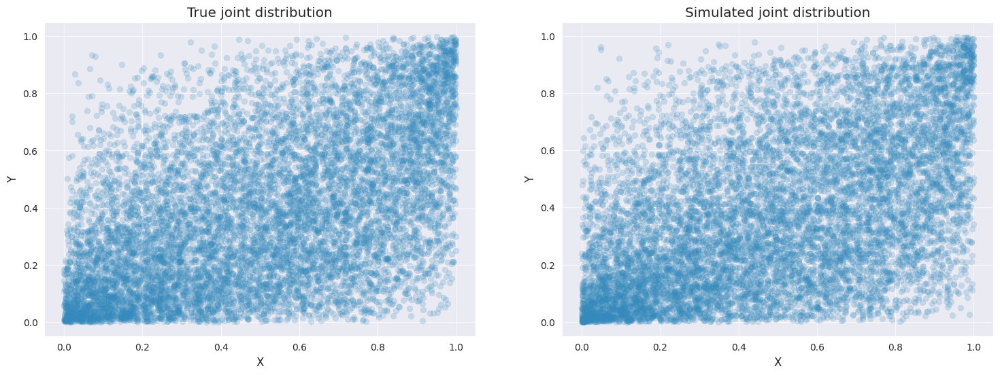

In [53]:
gaussian.compare_jointdist()

Y comparo el número de tareas que ejecutan los jugadores

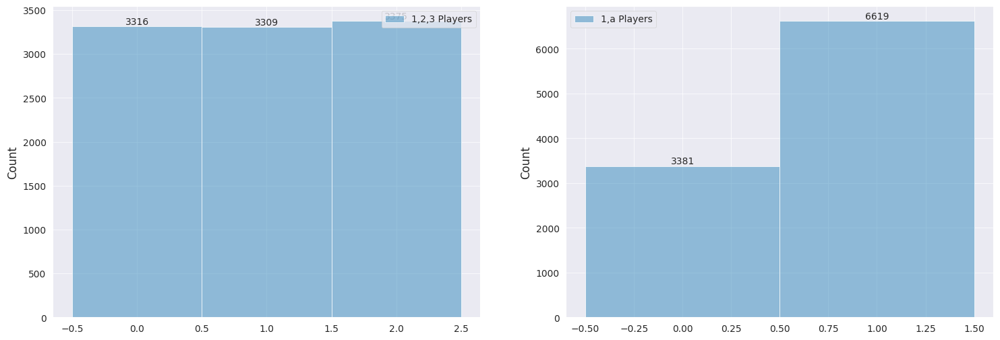

In [54]:
gaussian.compare_numtasks()

Ahora los trato de forma diferente.
El jugador 1 tiene el mismo coeficiente de correlación con los jugadores 2 y 3

In [69]:
seed = 1234567890
rho12 = 0.3
rho13 = 0.3
# no tengo libertad para elegir el tercer parámetro ya que la matriz debe ser
# positive semidefinite
# la condición es que
# rho12*rho13 - sqrt((1-rho12^2)(1-rho13^2)) <= rho23 <= rho12*rho13 + sqrt((1-rho12^2)(1-rho13^2))
# por ejemplo:
rho23 = rho12*rho13
corrMatrix = np.array([[1, rho12, rho13], [rho12, 1, rho23],  [rho13, rho23, 1]])
corrMatrix

array([[1.  , 0.3 , 0.3 ],
       [0.3 , 1.  , 0.09],
       [0.3 , 0.09, 1.  ]])

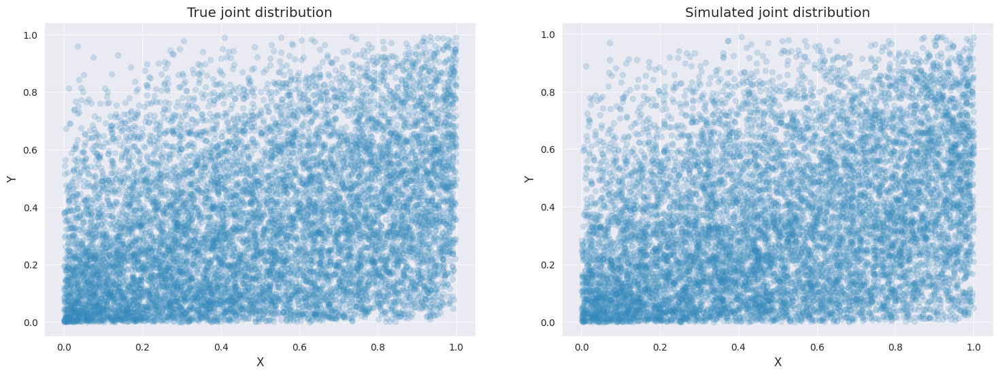

In [71]:
gaussian = QPQGaussian(corrMatrix)
gaussian.compare_jointdist()

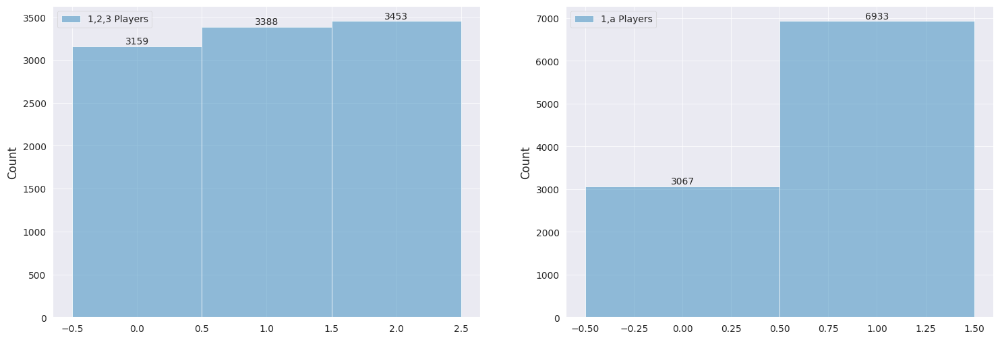

In [72]:
gaussian.compare_numtasks()

Propongo un nuevo escenario en el que los jugadores son diferentes.
El jugador 1 tiene diferetntes coeficientes de correlación con los jugadores 2 y 3

In [73]:
seed = 1234567890
rho12 = 0.8
rho13 = 0.3
# no tengo libertad para elegir el tercer parámetro ya que la matriz debe ser
# positive semidefinite
# la condición es que
# rho12*rho13 - sqrt((1-rho12^2)(1-rho13^2)) <= rho23 <= rho12*rho13 + sqrt((1-rho12^2)(1-rho13^2))
# por ejemplo:
rho23 = rho12*rho13
corrMatrix = np.array([[1, rho12, rho13], [rho12, 1, rho23],  [rho13, rho23, 1]])
corrMatrix

array([[1.  , 0.8 , 0.3 ],
       [0.8 , 1.  , 0.24],
       [0.3 , 0.24, 1.  ]])

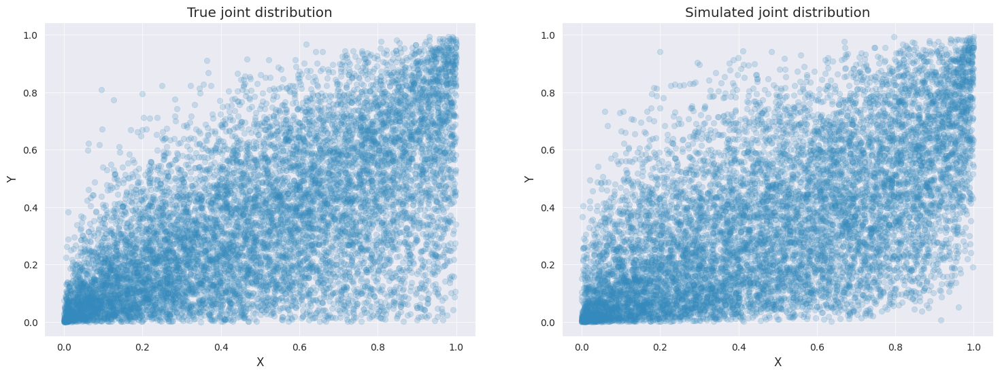

In [74]:
gaussian = QPQGaussian(corrMatrix)
gaussian.compare_jointdist()

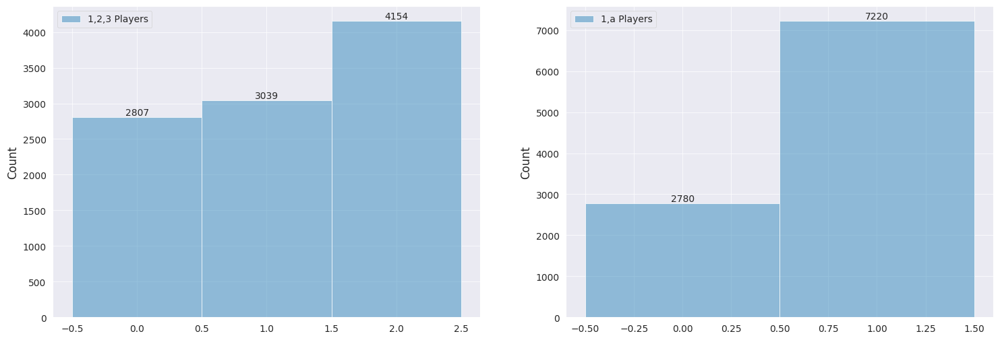

In [75]:
gaussian.compare_numtasks()

In [76]:
seed = 1234567890
rho12 = 0.8
rho13 = -0.8
# no tengo libertad para elegir el tercer parámetro ya que la matriz debe ser
# positive semidefinite
# la condición es que
# rho12*rho13 - sqrt((1-rho12^2)(1-rho13^2)) <= rho23 <= rho12*rho13 + sqrt((1-rho12^2)(1-rho13^2))
# por ejemplo:
rho23 = rho12*rho13
corrMatrix = np.array([[1, rho12, rho13], [rho12, 1, rho23],  [rho13, rho23, 1]])
corrMatrix

array([[ 1.  ,  0.8 , -0.8 ],
       [ 0.8 ,  1.  , -0.64],
       [-0.8 , -0.64,  1.  ]])

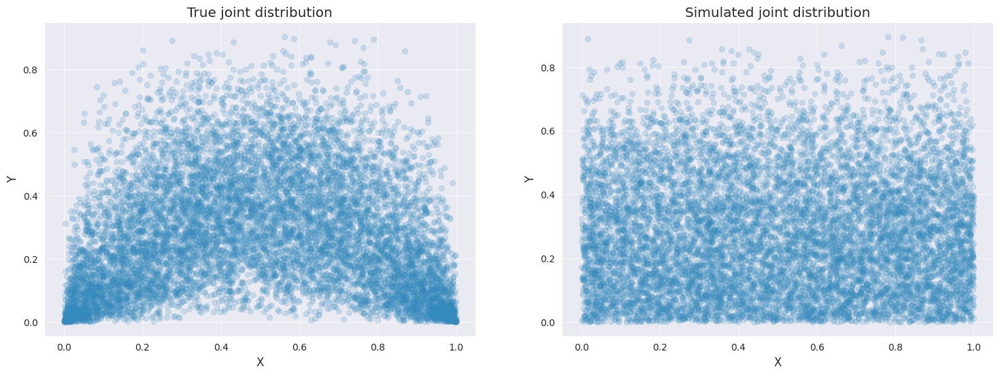

In [77]:
gaussian = QPQGaussian(corrMatrix)
gaussian.compare_jointdist()

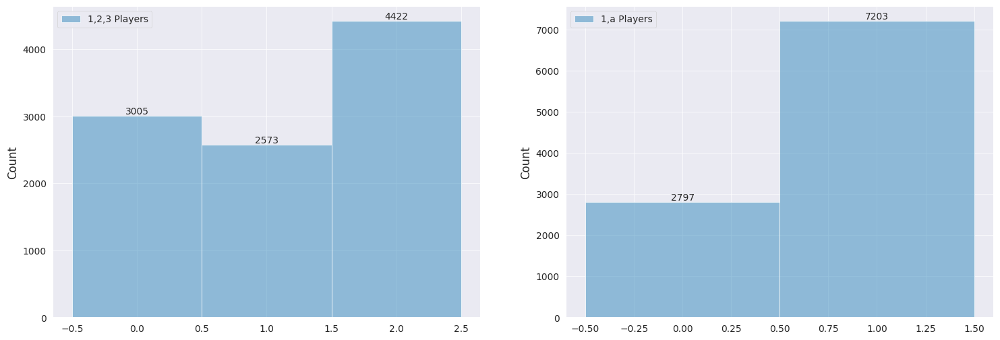

In [78]:
gaussian.compare_numtasks()

Me queda pendiente simular lo mismo pero con una transformada lineal. Con esa simulación se vuelve a calcular:
* Número de veces que gana un jugador a QPQ
* Utilidad que obtiene el jugador en QPQ

### Simulation of 10 players

In [ ]:
utility = np.zeros(players)
for k in range(samples):
  utility[u_argmin[k]] += u[u_argmin[k]][k]
utility

In [ ]:
!pip install pycop --quiet
from scipy.stats import norm
from pycop import simulation
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

In [ ]:
F9min=simplify(Fm.subs(n,9).doit())
F9min

9*y + exp(-(9*(-log(y))**theta)**(1/theta)) - 9*exp(-(8*(-log(y))**theta)**(1/theta)) + 36*exp(-(7*(-log(y))**theta)**(1/theta)) - 84*exp(-(6*(-log(y))**theta)**(1/theta)) + 126*exp(-(5*(-log(y))**theta)**(1/theta)) - 126*exp(-(4*(-log(y))**theta)**(1/theta)) + 84*exp(-(3*(-log(y))**theta)**(1/theta)) - 36*exp(-(2*(-log(y))**theta)**(1/theta))

In [ ]:
F10min=simplify(Fm.subs(n,10).doit())
F10min

10*y - exp(-(10*(-log(y))**theta)**(1/theta)) + 10*exp(-(9*(-log(y))**theta)**(1/theta)) - 45*exp(-(8*(-log(y))**theta)**(1/theta)) + 120*exp(-(7*(-log(y))**theta)**(1/theta)) - 210*exp(-(6*(-log(y))**theta)**(1/theta)) + 252*exp(-(5*(-log(y))**theta)**(1/theta)) - 210*exp(-(4*(-log(y))**theta)**(1/theta)) + 120*exp(-(3*(-log(y))**theta)**(1/theta)) - 45*exp(-(2*(-log(y))**theta)**(1/theta))

In [ ]:
players = 10
samples = 30000
t=2.5
vals = simulation.simu_archimedean("gumbel", players, samples, theta=t)

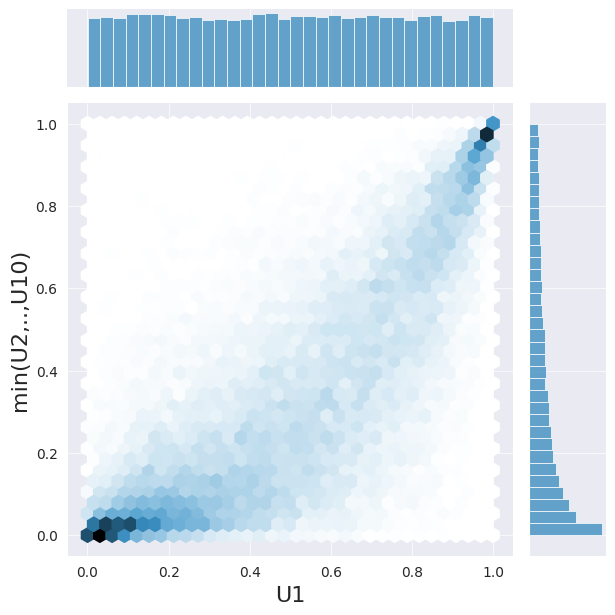

In [ ]:
# one player against the aggregate of 9
pdfY = AggreagatePlayer(cdfepr=F9min, theta_param=t, sym=y)
marginals = [stats.uniform(), pdfY]
joint_dist = CopulaDistribution(copula=GumbelCopula(theta=t), marginals=marginals)
sample = joint_dist.rvs(samples, random_state=default_rng)
h = sns.jointplot(x=sample[:, 0], y=sample[:, 1], kind="hex")
_ = h.set_axis_labels("U1", "min(U2,..,U10)", fontsize=16)

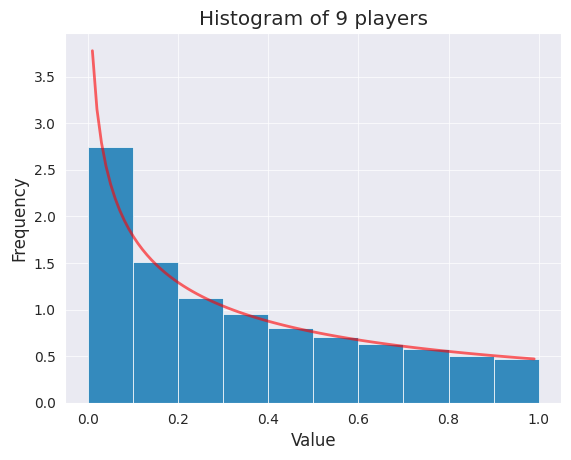

In [ ]:
u_min = np.minimum.reduce(vals[0: 10])

fig, ax = plt.subplots(1, 1)
ax.hist(u_min, density=True)
ax.set(title='Histogram of 9 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F9min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

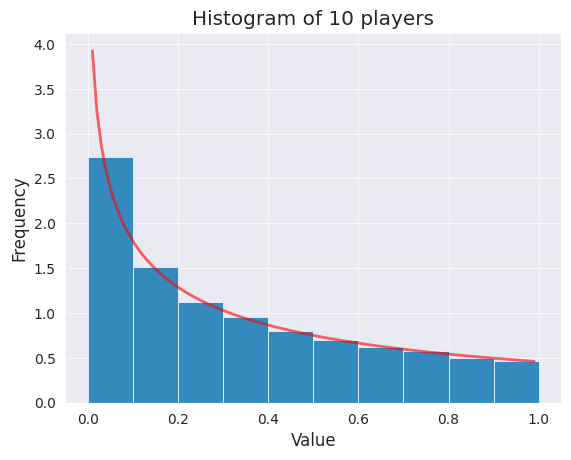

In [ ]:
u_min = np.minimum.reduce(vals)

fig, ax = plt.subplots(1, 1)
ax.hist(u_min, density=True)
ax.set(title='Histogram of 10 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F10min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

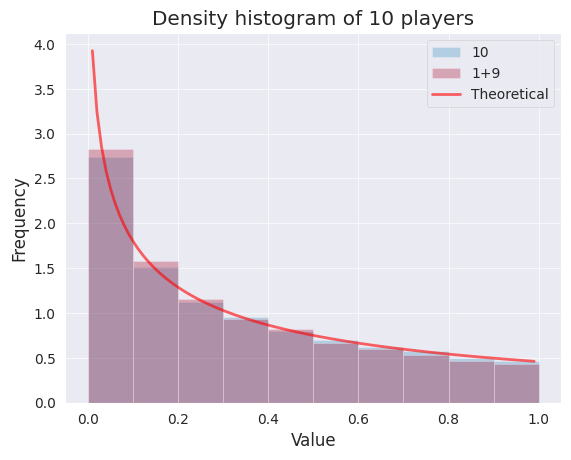

In [ ]:
# Minimum of 10 players with Gumble copula
u_min10 = np.minimum.reduce(vals)

# Minimum of 1 + aggregate player (9) with the Gumble copula!
u_min1_9 = np.minimum(sample[:, 0], sample[:, 1])

fig, ax = plt.subplots(1, 1)
ax.hist(u_min10, alpha=0.3, label='10', density=True)
ax.hist(u_min1_9, alpha=0.3, label='1+9', density=True)
ax.set(title='Density histogram of 10 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F10min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Theoretical')
ax.legend(loc='upper right')
plt.show()

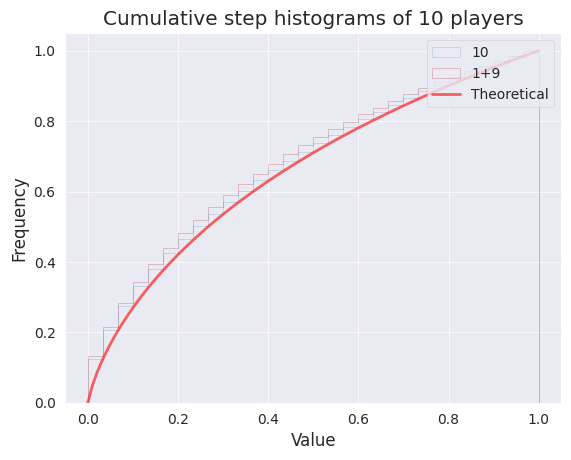

In [ ]:
n_bins = 30

fig, ax = plt.subplots(1, 1)
ax.hist(u_min10, n_bins, alpha=0.3, label='10', density=True, histtype='step', cumulative=True)
ax.hist(u_min1_9, n_bins, alpha=0.3, label='1+9', density=True, histtype='step', cumulative=True)
ax.set(title='Cumulative step histograms of 10 players', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, F10min.subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Theoretical')
ax.legend(loc='upper right')
plt.show()

## Clayton


### Introduccion
The Clayton copula is a copula that allows any specific non-zero level of (lower) tail dependency between individual variables. It is an Archimedean copula and exchangeable. A Clayton copula is defined as

$$C_\theta(u_1,…,u_d)=(\sum_i^d u_i^{-θ}−d+1)^{−\frac{1}{θ}}$$

In [ ]:
from sympy import *

# define variables
u1, u2, u3, z = symbols('u1 u2 u3 z', nonnegative=True)
theta = Symbol("theta")
# define Cyton copula function for 2 RV
Cclayton2 = pow(pow(u1, -theta)+pow(u2, -theta)-2+1, -1/theta)
# calculate and simplify Copula expression
simplify(Cclayton2)

(-1 + u2**(-theta) + u1**(-theta))**(-1/theta)

In [ ]:
# define Cyton copula function for 2 RV
Cclayton3 = pow(pow(u1, -theta)+pow(u2, -theta)+pow(u3, -theta)-3+1, -1/theta)
# calculate and simplify Copula expression
simplify(Cclayton3)

(-2 + u3**(-theta) + u2**(-theta) + u1**(-theta))**(-1/theta)

### Aggregate Player
To see how $d-1$ players could be replace by an aggregate player, suppose $U_1,\cdots,U_{d-1}$  are RVs with uniform distributions and correlated by a Clyton Copula.

For $Y=\min(u_1,u_2)$, and using equation (2), the distribution function of the aggregate player (minimun declared value of two players) is:

$$\begin{align*}
 F_m(y) & =F_{U_1}(y)+F_{U_2}(y)-  C(y,\cdots,y) \\
 & = 2y -\left(-1 + 2y^{-\theta}\right)^{\frac{-1}{\theta}}
\end{align*}$$

And for three players:
$$\begin{align*}
 F_m(y) & = 3y -3\left(-1 + 2y^{-\theta}\right)^{\frac{-1}{\theta}}+\left(-2 + 3y^{-\theta}\right)^{\frac{-1}{\theta}}
\end{align*}$$

In [ ]:
F2m = 2*z - Cclayton2.subs([(u1,z), (u2,z)])
F2m

2*z - 1/(-1 + 2/z**theta)**(1/theta)

In [ ]:
F3m=3*z - 3*Cclayton2.subs([(u1,z), (u2,z)]) + Cclayton3.subs([(u1,z), (u2,z), (u3,z)])
F3m

3*z - 3/(-1 + 2/z**theta)**(1/theta) + (-2 + 3/z**theta)**(-1/theta)

In [ ]:
from sympy import *
from sympy.abc import k, n

# define variables
y = symbols('y', nonnegative=True)
theta = Symbol("theta")

Fm=n*y + Sum((-1)**(k-1)*binomial(n, k)* pow(k*pow(y, -theta)-k+1, -1/theta), (k, 2, n))
Fm

n*y + Sum((-1)**(k - 1)*binomial(n, k)/(-k + k/y**theta + 1)**(1/theta), (k, 2, n))

In [ ]:
simplify(Fm.subs(n, 3))

3*y - 3/(-1 + 2/y**theta)**(1/theta) + (-2 + 3/y**theta)**(-1/theta)

## Ali-Mikhail-Haq family of copulas


### Introduction
the bivariate Ali-Mikhail-Haq (AMH) copula is:

$$C(u_1, u_2) = \frac{u_1 u_2}{1- \theta (1 - u_1)(1 - u_2)}$$

where $\theta∈[−1,+1)$, where the right boundary,
$\theta=1$, can sometimes be considered valid according to Mächler (2014). The copula $Θ\rightarrow 0$ becomes the independence copula.

In [ ]:
from sympy import *

# define variables
u1, u2, u3, z = symbols('u1 u2 u3 z', nonnegative=True)
theta = Symbol("theta")

# define AMH copula function for 2 RV
Camh2 = u1*u2/(1 - theta*(1-u1)*(1-u2))
# calculate and simplify Copula expression
Camh2

u1*u2/(-theta*(1 - u1)*(1 - u2) + 1)

In [ ]:
# define AMH copula function
Camh3 = u1*u2*u3/(1 - theta*(1-u1)*(1-u2)*(1-u3))
# calculate and simplify Copula expression
Camh3

u1*u2*u3/(-theta*(1 - u1)*(1 - u2)*(1 - u3) + 1)

### Aggregate Player

In [ ]:
F2m = 2*z - Camh2.subs([(u1,z), (u2,z)])
F2m

-z**2/(-theta*(1 - z)**2 + 1) + 2*z

In [ ]:
from sympy import *
from sympy.abc import k, n

# define variables
y = symbols('y', nonnegative=True)
theta = Symbol("theta")

Fm=n*y + Sum((-1)**(k-1)*binomial(n, k)* pow(y,k)/(1 - theta*pow(1-y, k)), (k, 2, n))
Fm

n*y + Sum((-1)**(k - 1)*y**k*binomial(n, k)/(-theta*(1 - y)**k + 1), (k, 2, n))

In [ ]:
Fm.subs(n, 2).doit()

-y**2/(-theta*(1 - y)**2 + 1) + 2*y

In [ ]:
simplify(Fm.subs(n, 3).doit())

y**3/(theta*(y - 1)**3 + 1) + 3*y**2/(theta*(y - 1)**2 - 1) + 3*y

### Simulation

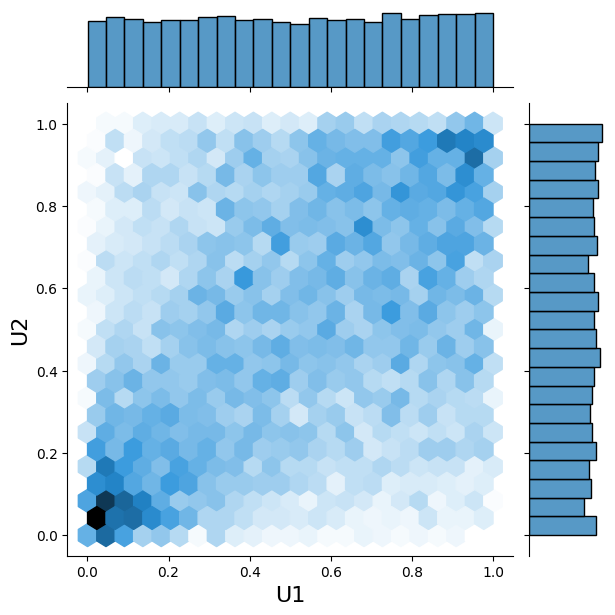

In [ ]:
!pip install pycop --quiet
from scipy.stats import norm
import seaborn as sns
import numpy as np
from pycop import simulation

players = 2
samples = 10000
t=0.9 # should be in [-1, 1]
u1, u2 = simulation.simu_archimedean("amh", players, samples, theta=t)

h = sns.jointplot(x=u1, y=u2, kind="hex")
_ = h.set_axis_labels("U1", "U2", fontsize=16)

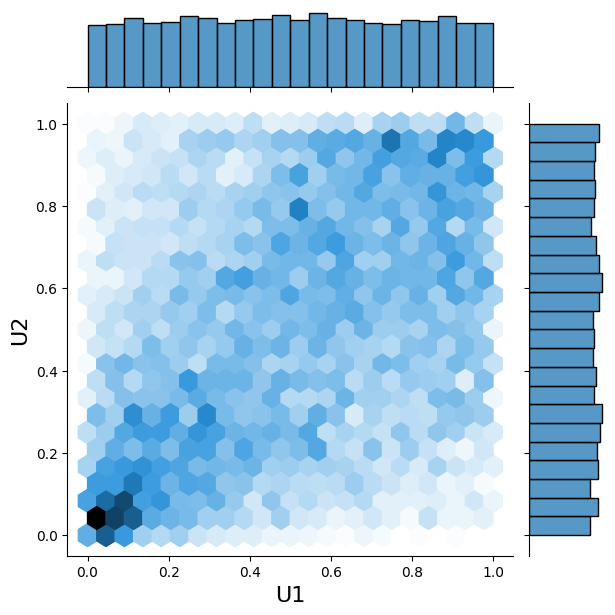

In [ ]:
players = 5
samples = 10000
t=0.9
vals = simulation.simu_archimedean("amh", players, samples, theta=t)

h = sns.jointplot(x=vals[0], y=vals[1], kind="hex")
_ = h.set_axis_labels("U1", "U2", fontsize=16)

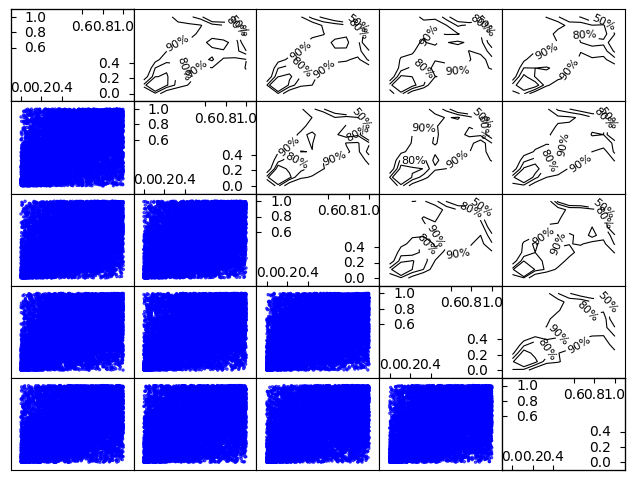

In [ ]:
from pycop import utils
utils.empiricalplot(vals, contour=True)

### Copula of the aggregated Player

In [ ]:
F2min= Fm.subs(n,2).doit()
F2min

-y**2/(-theta*(1 - y)**2 + 1) + 2*y

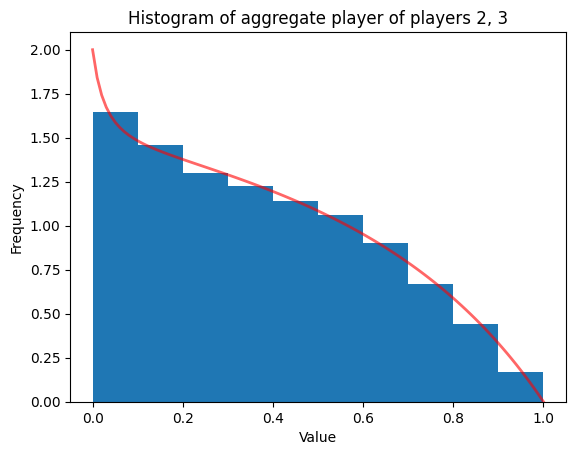

In [ ]:
# 1.1 Check that the minimum of the two players corresponds to the function F2min
u_aggr = np.minimum(vals[1], vals[2])

fig, ax = plt.subplots(1, 1)
ax.hist(u_aggr, density=True)
ax.set(title='Histogram of aggregate player of players 2, 3', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F2min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

In [ ]:
F3min= Fm.subs(n,3).doit()
F3min

y**3/(-theta*(1 - y)**3 + 1) - 3*y**2/(-theta*(1 - y)**2 + 1) + 3*y

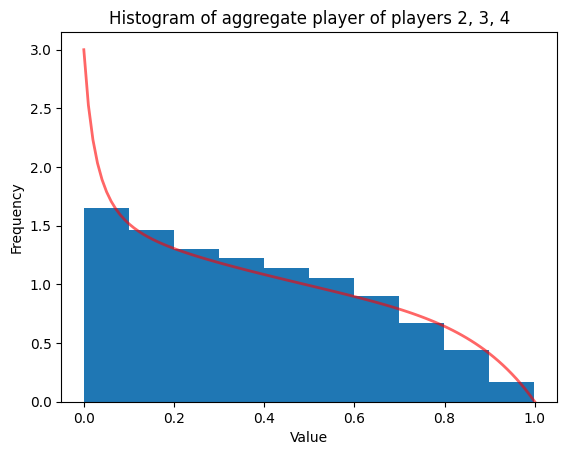

In [ ]:
# 1.1 Check that the minimum of the three players corresponds to the function F3min
u_aggr = np.minimum(vals[1], vals[2], vals[3])

fig, ax = plt.subplots(1, 1)
ax.hist(u_aggr, density=True)
ax.set(title='Histogram of aggregate player of players 2, 3, 4', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F3min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

In [ ]:
F4min= Fm.subs(n,4).doit()
F4min

-y**4/(-theta*(1 - y)**4 + 1) + 4*y**3/(-theta*(1 - y)**3 + 1) - 6*y**2/(-theta*(1 - y)**2 + 1) + 4*y

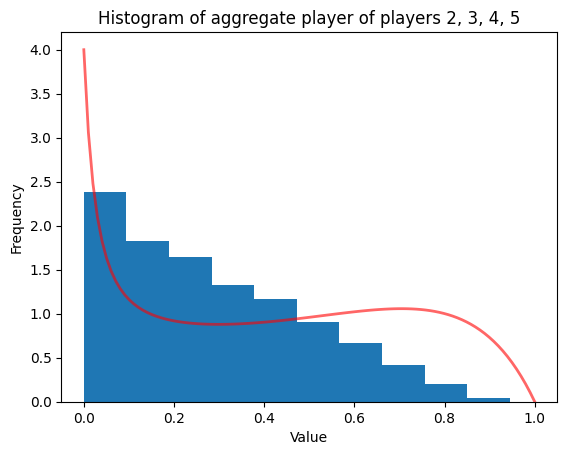

In [ ]:
# 1.1 Check that the minimum of the four players corresponds to the function F4min
u_aggr = np.minimum(np.minimum(vals[1], vals[2]),np.minimum(vals[3], vals[4]))

fig, ax = plt.subplots(1, 1)
ax.hist(u_aggr, density=True)
ax.set(title='Histogram of aggregate player of players 2, 3, 4, 5', xlabel='Value', ylabel='Frequency')
x = np.linspace(0.0, 1.0, num=100)
pr = lambdify(y, diff(F4min, y).subs(theta, t), "numpy")
ax.plot(x, pr(x),'r-', lw=2, alpha=0.6, label='Pr aggr')
plt.show()

# Gaussian copula

## Introduction
(wikipedia) The Gaussian copula is a distribution over the unit hypercube
$[0,1]^{d}$. It is constructed from a multivariate normal distribution over
$\mathbb {R}^{d}$ by using the probability integral transform.

For a given correlation matrix ${\displaystyle R\in [-1,1]^{d\times d}}$, the Gaussiacopula with parameter matrix $R$ can be written as
$$C_{R}^{\text{Gauss}}(u)=\Phi _{R}\left(\Phi ^{-1}(u_{1}),\dots ,\Phi ^{-1}(u_{d})\right),$$
where $\Phi ^{-1}$ is the inverse cumulative distribution function of a standard normal and $\Phi _{R}$ is the joint cumulative distribution function of a multivariate normal distribution with mean vector zero and covariance matrix equal to the correlation matrix $R$. While there is no simple analytical formula for the copula function, ${\displaystyle C_{R}^{\text{Gauss}}(u)}$, it can be upper or lower bounded, and approximated using numerical integration. The density can be written as:
$${\displaystyle c_{R}^{\text{Gauss}}(u)={\frac {1}{\sqrt {\det {R}}}}\exp \left(-{\frac {1}{2}}{\begin{pmatrix}\Phi ^{-1}(u_{1})\\\vdots \\\Phi ^{-1}(u_{d})\end{pmatrix}}^{T}\cdot \left(R^{-1}-I\right)\cdot {\begin{pmatrix}\Phi ^{-1}(u_{1})\\\vdots \\\Phi ^{-1}(u_{d})\end{pmatrix}}\right),}$$
where $\mathbf {I}$  is the identity matrix.

## Simulation

In [ ]:
# define copula parameters
rho = 0.8
mu_c = np.array([0,0])
cov_c = np.array([[1,rho],[rho,1]])
# define multivariate normal distribution
dist_c = stats.multivariate_normal(mean=mu_c, cov=cov_c)
# sample from the distribution
sample_c = dist_c.rvs(size=10000)

In [ ]:
# obtain marginals X and Y
X = sample_c[:,0]
Y = sample_c[:,1]

[Text(0.5, 1.0, 'Scatterplot of X and Y'),
 Text(0.5, 0, 'X'),
 Text(0, 0.5, 'Y')]

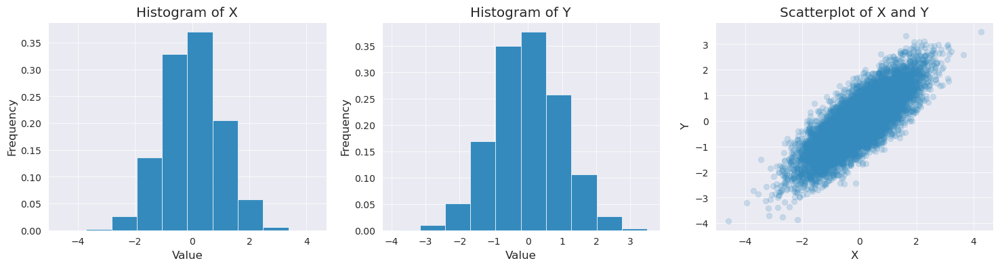

In [ ]:
# plot marginals and joint distribution
fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)
ax[0].hist(X, density=True)
ax[0].set(title='Histogram of X', xlabel='Value', ylabel='Frequency')
ax[1].hist(Y, density=True)
ax[1].set(title='Histogram of Y', xlabel='Value', ylabel='Frequency')
ax[2].scatter(X, Y, alpha=0.2)
ax[2].set(title='Scatterplot of X and Y', xlabel='X', ylabel='Y')

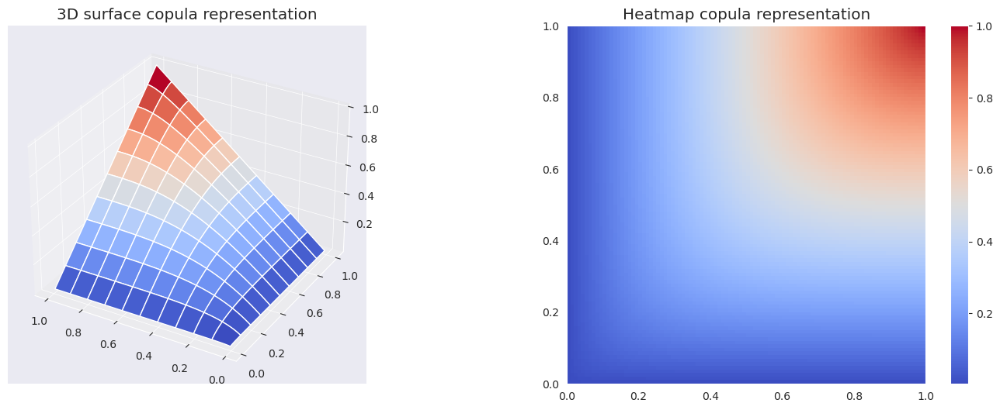

In [ ]:
# create a grid
x = np.arange(0.01,1.01,0.01)
y = np.arange(0.01,1.01,0.01)
x,y = np.meshgrid(x,y)

# apply inverse standard normal CDF to each point on a grid
pairs = np.array([[i, j] for (i,j) in zip(stats.norm.ppf(x).flatten(),stats.norm.ppf(y).flatten())])
# calculate the value of bivariate normal CDF for each point on a grid
z = dist_c.cdf(pairs).reshape([100,100])

# plot the resulting copula
fig = plt.figure(figsize=(18,6))
ax0 = fig.add_subplot(121, projection='3d')
ax1 = fig.add_subplot(122)
ax0.plot_surface(x, y, z, cmap=cm.coolwarm, rstride=10, cstride=10, linewidth=1)
#ax0.invert_yaxis()
ax0.invert_xaxis()
ax0.set(title='3D surface copula representation')
img = ax1.imshow(np.flip(z,axis=0), cmap=cm.coolwarm, extent=[0,1,0,1])
ax1.grid(False)
ax1.set(title='Heatmap copula representation')
fig.colorbar(img)

[Text(0.5, 1.0, 'Scatterplot of transformed X and Y'),
 Text(0.5, 0, 'X'),
 Text(0, 0.5, 'Y')]

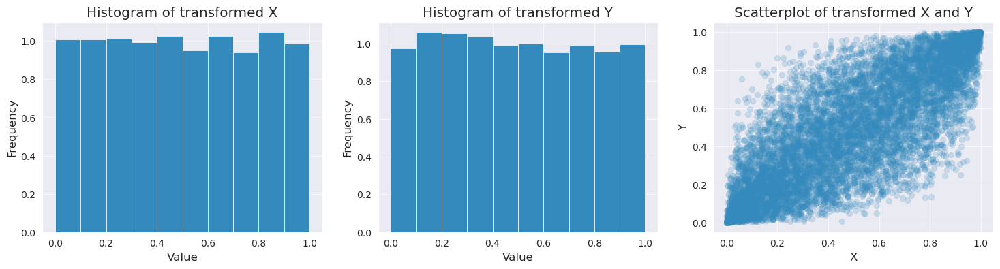

In [ ]:
# transform marginals to uniform
u_x = stats.norm.cdf(X)
u_y = stats.norm.cdf(Y)

# plot marginals and joint distribution
fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)
ax[0].hist(u_x, density=True)
ax[0].set(title='Histogram of transformed X', xlabel='Value', ylabel='Frequency')
ax[1].hist(u_y, density=True)
ax[1].set(title='Histogram of transformed Y', xlabel='Value', ylabel='Frequency')
ax[2].scatter(u_x, u_y, alpha=0.2)
ax[2].set(title='Scatterplot of transformed X and Y', xlabel='X', ylabel='Y')

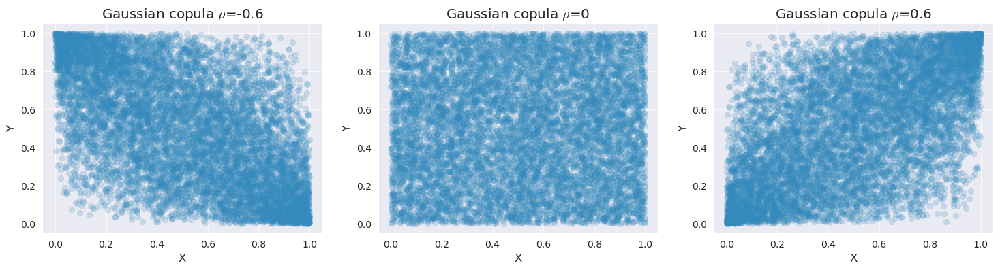

In [ ]:
fig, ax = plt.subplots(figsize=(18,4), nrows=1, ncols=3)

for i,rho in zip([0,1,2],[-0.6, 0, 0.6]):
    mu_c = np.array([0,0])
    cov_c = np.array([[1,rho],[rho,1]])
    dist_c = stats.multivariate_normal(mean=mu_c, cov=cov_c)
    sample_c = dist_c.rvs(size=10000)

    X = sample_c[:,0]
    Y = sample_c[:,1]
    u_x = stats.norm.cdf(X)
    u_y = stats.norm.cdf(Y)
    ax[i].scatter(u_x, u_y, alpha=0.2)
    ax[i].set(title=r'Gaussian copula $\rho$=' + str(rho), xlabel='X', ylabel='Y')

[Text(0.5, 1.0, 'Joint distribution derived from copula'),
 Text(0.5, 0, 'X'),
 Text(0, 0.5, 'Y')]

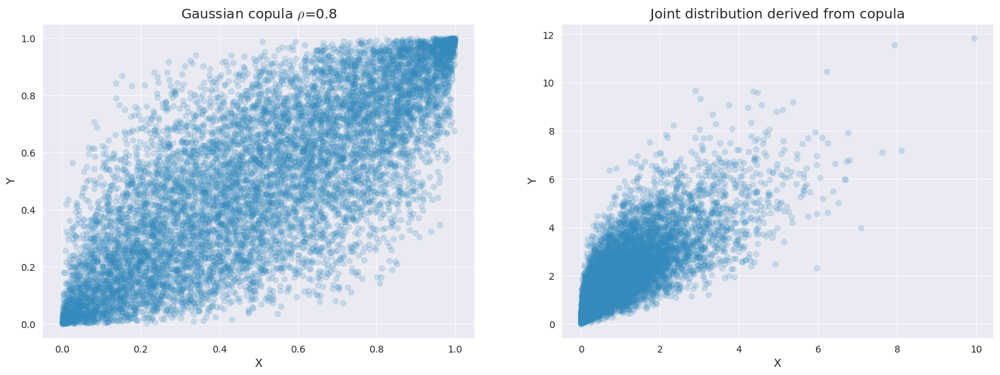

In [ ]:
# define copula parameters
rho=0.8
mu_c = np.array([0,0])
cov_c = np.array([[1,rho],[rho,1]])
dist_c = stats.multivariate_normal(mean=mu_c, cov=cov_c)
sample_c = dist_c.rvs(size=10000)

# transform marginals to uniform
X = sample_c[:,0]
Y = sample_c[:,1]
u_x = stats.norm.cdf(X)
u_y = stats.norm.cdf(Y)
# define required marginal distributions
dist_x = stats.expon()
dist_y = stats.gamma(a=2)

fig, ax = plt.subplots(figsize=(18,6), nrows=1, ncols=2)
ax[0].scatter(u_x, u_y, alpha=0.2)
ax[0].set(title=r'Gaussian copula $\rho$=' + str(rho), xlabel='X', ylabel='Y')
ax[1].scatter(dist_x.ppf(u_x), dist_y.ppf(u_y), alpha=0.2)
ax[1].set(title='Joint distribution derived from copula', xlabel='X', ylabel='Y')